In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns




In [99]:
# #Selecting GM12878 sequences

# #GM
# USE_CELL=          'GM12878'
# OFF_TARGET_CELL_1= 'HepG2'
# OFF_TARGET_CELL_2= 'K562'

# first_files = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt'
# first_locus_tag = 'GATA1'

# second_files = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_HNF4A.txt'
# second_locus_tag = 'HNF4A'



In [100]:
#Selecting K562 sequences

# #K562
# USE_CELL=          'K562'
# OFF_TARGET_CELL_1= 'HepG2'
# OFF_TARGET_CELL_2= 'GM12878'

# first_files = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_HNF4A.txt'
# first_locus_tag = 'HNF4A'

# second_files = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_CD19.txt'
# second_locus_tag = 'CD19'

# blat_file = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/blat/blat_results.txt'
# filter_more_than_bp = 40

In [101]:
# #Selecting HEPG2 sequences

# #HepG2
# USE_CELL=          'HepG2'
# OFF_TARGET_CELL_1= 'K562'
# OFF_TARGET_CELL_2= 'GM12878'

# first_files = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt'
# first_locus_tag = 'GATA1'

# second_files = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_CD19.txt'
# second_locus_tag = 'CD19'


In [16]:

def blat_filter_using_train_similarity(file=None, bp_simmilarity_limit=40):
    blat_all_generated_train = pd.read_csv(file , sep='\t')
    blat_all_generated_train['90_seq_id_bp_length'] = blat_all_generated_train['90_seq_id_bp_length'].apply(lambda x : 0 if np.isnan(x) else x)
    blat_all_generated_train = blat_all_generated_train[blat_all_generated_train['90_seq_id_bp_length'] != 0]
    blat_justgen_train = blat_all_generated_train[blat_all_generated_train['Dataset'] == 'Generated x Train']
    return set(blat_justgen_train[blat_justgen_train['90_seq_id_bp_length'] > bp_simmilarity_limit]['ID'].values)



def blat_filter_using_generated_similarity(file=None, bp_simmilarity_limit=40):
    blat_all_generated_train = pd.read_csv(file , sep='\t')
    blat_all_generated_train['90_seq_id_bp_length'] = blat_all_generated_train['bp_length'].apply(lambda x : 0 if np.isnan(x) else x)
    blat_all_generated_train = blat_all_generated_train[blat_all_generated_train['90_seq_id_bp_length'] != 0]
    return set(blat_all_generated_train[blat_all_generated_train['90_seq_id_bp_length'] > bp_simmilarity_limit]['query_id'].values)



def filtering_blat(df_b_filter,set_use):
    before_rows = df_b_filter.shape[0]
    df_b_filter = df_b_filter [ df_b_filter['SEQ_ID'].apply(lambda x: x not in set_use)].copy()
    print (f'Generated_sequences filtered: { before_rows - df_b_filter.shape[0]} ' )
    return df_b_filter



In [12]:
file_a = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/blat/blat_results.txt' 

dfa = pd.read_csv(file_a , sep='\t')
dfa

,ID,SEQUENCE,90_seq_id_bp_length,100_seq_id_bp_length,Dataset
0,0_GENERATED_GM12878,TGTTCTCTCTGTCTCTGTTGAGTTAACAACTACCTAATCACTCTTG...,NaN,NaN,Generated x Train
1,1_GENERATED_GM12878,AGAATCTGAATATTTACAGTGCAGCATATTAACCTCATTGTACATT...,NaN,NaN,Generated x Train
2,2_GENERATED_GM12878,TTTTTTTAAGAAAACCCGTGCTAAAGAAAGCCACCCTGTCTTGTTA...,NaN,NaN,Generated x Train
3,3_GENERATED_GM12878,ACTAAAACAAGTATAATGAAACATGTTTTAGGAAGAGAAACCCCCT...,NaN,NaN,Generated x Train
4,4_GENERATED_GM12878,CATCTCTGGGAAATGACACTTATTTTTAATAGACGTTAAAGGTGAC...,NaN,NaN,Generated x Train
...,...,...,...,...,...
309560,chr8_112836903_112837103_random,ATGAAACTAAACTTCAAGTTTGCTTGATGATAGTAATTACATGCTT...,NaN,NaN,Random x Train
309561,chr6_80306183_80306383_random,GTTACTCTTTGACAATACTTTGCATTAAGTTTAATTTAATGTTAAA...,NaN,NaN,Random x Train
309562,chr1_238019008_238019208_random,TGAATAAACTGAAATGGCTCCAGTCAAAACTGGTTGTTGGGAAAGG...,NaN,NaN,Random x Train
309563,chr1_111468255_111468455_random,TCATGTAAGTCACAAGGAAATGAGTTCATCCAACAACCAGAGGGAA...,22.0,NaN,Random x Train


In [15]:




#blat_filter_using_train_similarity(file_t)

152

In [1]:

def generate_specificity(file_in, add_tag, blat_set):
    df_normalized = pd.read_csv(file_in, sep='\t')
    print ('blat filtering_training')
    filtering_blat(df_normalized,  blat_set['train'])
    print ('blat filtering_generated')
    filtering_blat(df_normalized,  blat_set['test'])
    print (file_in,add_tag )
    print (df_normalized.columns)
    df_normalized.groupby(['CELL_TYPE', 'TAG']).count()
    df_normalized_to_filter = df_normalized.copy()
    print(df_normalized_to_filter.shape)
    df_normalized_to_filter = df_normalized_to_filter.query("TAG != 'Random_Genome_Regions' and TAG != 'Promoters' and TAG!= 'Negative_shuffle' ").copy()
    print(df_normalized_to_filter.shape)
    df_normalized_to_filter['CELL_TYPE'] = df_normalized_to_filter.apply(lambda x: USE_CELL if x['TAG'] == 'Negative' else x['CELL_TYPE'], axis=1 )
    df_group_names = pd.DataFrame(
    ['PERCENTILE_NORMALIZED_CHROMBPNET_GM12878',
     'PERCENTILE_NORMALIZED_CHROMBPNET_K562',
    'PERCENTILE_NORMALIZED_CHROMBPNET_HepG2',
    'PERCENTILE_NORMALIZED_DNASE_GM12878_enformer.bw',
    'PERCENTILE_NORMALIZED_DNASE_K562_enformer.bw',
    'PERCENTILE_NORMALIZED_DNASE_HepG2_enformer.bw',
    'PERCENTILE_NORMALIZED_CAGE_GM12878_enformer.bw',
    'PERCENTILE_NORMALIZED_CAGE_K562_enformer.bw',
    'PERCENTILE_NORMALIZED_CAGE_HepG2_enformer.bw'], columns=['names'])


    df_group_names['CELL_TYPE'] = df_group_names['names'].apply(lambda x : x.replace('_enformer.bw','').split('_')[-1] )
    df_group_names['DATA_TYPE'] = df_group_names['names'].apply(lambda x : x.replace('_enformer.bw','').split('_')[-2] )


    for k,df_v in df_group_names.groupby('DATA_TYPE'):
        print (k)
        print (df_v)
        assays_filtered = df_v['names'].values.tolist()
        final_spec_name = f'SPECIFICITY_{k}'
        print (final_spec_name)
        dict_selection_celltype = dict(zip(df_v['CELL_TYPE'].values, df_v['names'].values ))
        df_normalized_to_filter[final_spec_name] = (df_normalized_to_filter.apply(lambda x : x[dict_selection_celltype[USE_CELL]] , axis=1) /   df_normalized_to_filter[assays_filtered] .sum(1)).values
        df_normalized_to_filter[final_spec_name + '_off1'] = (df_normalized_to_filter.apply(lambda x : x[dict_selection_celltype[OFF_TARGET_CELL_1]] , axis=1) /   df_normalized_to_filter[assays_filtered] .sum(1)).values
        df_normalized_to_filter[final_spec_name + '_off2']  = (df_normalized_to_filter.apply(lambda x : x[dict_selection_celltype[OFF_TARGET_CELL_2]] , axis=1) /   df_normalized_to_filter[assays_filtered] .sum(1)).values

    df_normalized_to_filter['is_training'] = df_normalized_to_filter["TAG"].apply(lambda x : x in ["Training" ,  "Validation", "Test"]).values
    new_col_names = []
    for x in df_normalized_to_filter.columns:
        if x not in   ['SEQ_ID', 'CELL_TYPE', 'SEQUENCE', 'TAG']:
            new_col_names .append(add_tag+'_'+x)
        else:
            new_col_names .append(x)
    df_normalized_to_filter.columns = new_col_names
    return df_normalized_to_filter








In [104]:



def generate_plot_specificity_and_signal_single_category(signal_list, specificity_list,df_category_test, title, show_subgroup_set=None ):
    # Set the style of the matplotlib plot
    sns.set(style="whitegrid")


    fig, ax = plt.subplots(3, 1, figsize=(8, 18))

    for n, (signal, specificity) in enumerate(zip(signal_list, specificity_list)):

        # Use a distinct color from seaborn's color palette
        color = sns.color_palette("husl", 8)[n]
        size_points=3
        alphas = 0.01
        if show_subgroup_set:
            color = df_category_test['SEQ_ID'].apply(lambda x : 'black' if x in  show_subgroup_set else 'gray')
            size_points = df_category_test['SEQ_ID'].apply(lambda x : 10 if x in  show_subgroup_set else size_points)
            alphas = df_category_test['SEQ_ID'].apply(lambda x : 1 if x in  show_subgroup_set else alphas)




        # Scatter plot with adjusted alpha and size
        ax[n].scatter(df_category_test[signal].values,
                    df_category_test[specificity].values,
                    s=size_points , alpha=alphas, color=color)

        # Setting labels and title
        ax[n].set_xlabel(signal, fontsize=12)
        ax[n].set_ylabel(specificity, fontsize=12)
        ax[n].set_title(f"{title} {specificity.replace('SPECIFICITY_', '')}", fontsize=14)

        # Set aspect ratio
        ax[n].set_aspect('equal', adjustable='box')

        # Improve layout and aesthetics
        ax[n].spines['top'].set_visible(False)
        ax[n].spines['right'].set_visible(False)
        ax[n].tick_params(axis='both', which='major', labelsize=10)
        ax[n].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()




def basic_scatter_agains_train(df_plot_use, tag, cell_type_basic_plot, cell_using ):
    signal_list = [f'{tag}_PERCENTILE_NORMALIZED_CHROMBPNET_{cell_using}', f'{tag}_PERCENTILE_NORMALIZED_DNASE_{cell_using}_enformer.bw', f'{tag}_PERCENTILE_NORMALIZED_CAGE_{cell_using}_enformer.bw']
    specificity_list = [f'{tag}_SPECIFICITY_CHROMBPNET', f'{tag}_SPECIFICITY_DNASE' , f'{tag}_SPECIFICITY_CAGE']

    df_category_test = df_plot_use.query(f'TAG == "Generated" and CELL_TYPE == "{cell_type_basic_plot}" ')
    title = f'{cell_using} GENERATED'
    generate_plot_specificity_and_signal_single_category(signal_list, specificity_list,df_category_test, title )

    df_category_test = df_plot_use.query(f'TAG == "Generated" and CELL_TYPE == "{cell_type_basic_plot}"  ').sample(12000)
    title = f'{cell_using} GENERATED SUBSAMPLE (12K)'
    generate_plot_specificity_and_signal_single_category(signal_list, specificity_list,df_category_test, title )

    df_category_test = df_plot_use.query(f'{tag}_is_training == True and CELL_TYPE == "{cell_type_basic_plot}" ')
    title = f'{cell_using} TRAIN/VAL/TEST'
    generate_plot_specificity_and_signal_single_category(signal_list, specificity_list,df_category_test, title )




def show_groups_plot(df_plot_use, tag, cell_type_basic_plot,  show_subgroup_set, cell_using):
    signal_list = [f'{tag}_PERCENTILE_NORMALIZED_CHROMBPNET_{cell_using}', f'{tag}_PERCENTILE_NORMALIZED_DNASE_{cell_using}_enformer.bw', f'{tag}_PERCENTILE_NORMALIZED_CAGE_{cell_using}_enformer.bw']
    specificity_list = [f'{tag}_SPECIFICITY_CHROMBPNET', f'{tag}_SPECIFICITY_DNASE' , f'{tag}_SPECIFICITY_CAGE']

    df_category_test = df_plot_use.query(f'TAG == "Generated" and CELL_TYPE == "{cell_type_basic_plot}" ')
    title = '{cell_using} GENERATED'
    generate_plot_specificity_and_signal_single_category(signal_list, specificity_list,df_category_test, title , show_subgroup_set)


In [ ]:

# cell_type_basic_plot = 'GM12878'
# locus_tag = 'HNF4A'
# basic_scatter_agains_train(second_locus, locus_tag, cell_type_basic_plot)

In [ ]:
# sig_cols_to_filter = [s for s in columns_to_rank if 'PERCENTILE' in s] 
# specificity_cols_to_filter = [s for s in columns_to_rank if 'SPECIFICITY' in s] 

# specificity_cols_to_filter_first_locus = [s for s in columns_to_rank if 'SPECIFICITY' in s and  first_locus_tag in s  ] 
# specificity_cols_to_filter_second_locus = [s for s in columns_to_rank if 'SPECIFICITY' in s and  second_locus_tag in s  ] 

# # #nice tresholding with 450
# # filter_conditions = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.55).all(axis=1) &  (df_cell_centrinc_rank[specificity_cols_to_filter] > 0.6).all(axis=1)
# # set_top_selection = set(df_cell_centrinc_rank[filter_conditions]['SEQ_ID'].values)
# # len(set_top_selection)

# chrom_spec = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.8).all(axis=1)  &  (df_cell_centrinc_rank[[c for c in specificity_cols_to_filter if 'CHROMBPNET' in c]] > 0.75).all(axis=1)

# DNASE_spec = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.8).all(axis=1)  &  (df_cell_centrinc_rank[[c for c in specificity_cols_to_filter if 'DNASE' in c]] > 0.75).all(axis=1)

# CAGE_spec = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.8).all(axis=1)  &  (df_cell_centrinc_rank[[c for c in specificity_cols_to_filter if 'CAGE' in c]] > 0.75).all(axis=1)

# filter_conditions = chrom_spec |  DNASE_spec | CAGE_spec   #selection with or

# set_top_selection = set(df_cell_centrinc_rank[filter_conditions]['SEQ_ID'].values)
# len(set_top_selection)

# print (' chrom', chrom_spec.sum()  ,'\n' ,'DNASE',  DNASE_spec.sum(),'\n' , 'CAGE' ,CAGE_spec.sum())
# print ('total:', len(set_top_selection))



# Random endogenous


In [115]:
def select_random(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=200):
    df_merge = df_merge_in.copy()
    random_endogenous = pd.DataFrame(df_merge.query(f'{first_locus_tag}_is_training == True and CELL_TYPE == "{USE_CELL}" ').sample(number)['SEQ_ID'])
    random_endogenous['category'] = 'Random_endogenous'
    return random_endogenous


def select_shuffle_positives(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=50):
    df_merge = df_merge_in.copy()
    shuffle_positives = pd.DataFrame(df_merge.query(f' TAG == "{USE_CELL}_positive_shuffle" and CELL_TYPE == "{USE_CELL}" ').sample(number)['SEQ_ID'])
    shuffle_positives['category'] = 'Shuffle_positive'
    return shuffle_positives



def select_random_generated(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=200):
    df_merge = df_merge_in.copy()
    random_generated = pd.DataFrame(df_merge.query(f'TAG == "Generated" and CELL_TYPE == "{USE_CELL}" ').sample(number)['SEQ_ID'])
    random_generated['category'] = 'Random_generated'
    return random_generated




def select_positives(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=100, sig_cols_to_filter=None, specificity_cols_to_filter=None, filter_by_cell_dict=None):
    df_merge = df_merge_in.copy()
    positive_controls_select = df_merge.query(f'TAG == "{USE_CELL}_positive" and CELL_TYPE == "{USE_CELL}" ').copy()
    positive_controls_select['rank_mean'] = positive_controls_select[sig_cols_to_filter + specificity_cols_to_filter].rank().mean(1).values.tolist()
    positive_controls_select['rank_mean'] = positive_controls_select[sig_cols_to_filter + specificity_cols_to_filter].rank().mean(1).values.tolist()
    positive_values_filter = (positive_controls_select[sig_cols_to_filter] > filter_by_cell_dict[USE_CELL]).all(axis=1) 
    positive_controls_select = positive_controls_select.sort_values(['rank_mean'], ascending=False)
    #print ('PLOTING ALL')
    positive_controls = pd.DataFrame(positive_controls_select[positive_values_filter].head(number)['SEQ_ID'])
    #positive_controls = pd.DataFrame(positive_controls_select['SEQ_ID'])
    positive_controls['category'] = 'Positive'
    return positive_controls




def select_high_specificity(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=400, sig_cols_to_filter=None, specificity_cols_to_filter=None, random_generated= None, treshold_dictionary=None):
  df_merge = df_merge_in.copy()
  treshold_use = treshold_dictionary[USE_CELL] #tresholding by cell the base specificity
  df_high_spec = df_merge.query(f"TAG== 'Generated' and CELL_TYPE == '{USE_CELL}'  ")
  df_high_spec  = df_high_spec[df_high_spec.apply(lambda x : x['SEQ_ID'] not in random_generated['SEQ_ID'].values ,axis=1)] # removing random_endogenous
  df_selected = df_high_spec[(df_high_spec[sig_cols_to_filter] > 0.5).all(axis=1) & (df_high_spec[specificity_cols_to_filter] > treshold_use).all(axis=1) & ((df_high_spec[[c for c in specificity_cols_to_filter if 'CHROMBPNET' in c]] > 0.80).all(axis=1) | (df_high_spec[[c for c in specificity_cols_to_filter if 'DNASE' in c]] > 0.80).all(axis=1)| (df_high_spec[[c for c in specificity_cols_to_filter if 'CAGE' in c]] > 0.80).all(axis=1))].copy()
  df_selected['rank_CHROMBPNET'] = df_selected[[c for c in specificity_cols_to_filter if 'CHROMBPNET' in c]].rank(ascending=False).mean(1)
  df_selected['rank_DNASE'] = df_selected[[c for c in specificity_cols_to_filter if 'DNASE' in c]].rank(ascending=False).mean(1)
  df_selected['rank_CAGE'] = df_selected[[c for c in specificity_cols_to_filter if 'CAGE' in c]].rank(ascending=False).mean(1)
  df_selected['access_rank'] = df_selected[['rank_CHROMBPNET', 'rank_DNASE']].mean(1)    
  df_selected['final_rank'] = df_selected[['access_rank', 'rank_CAGE']].mean(1)
  print (df_selected.shape, 'total selection')
  df_selected = df_selected.sort_values("final_rank", ascending=True).head(number)
  df_high_spec_out = pd.DataFrame(df_selected['SEQ_ID'].values.tolist())
  df_high_spec_out.columns = ['SEQ_ID']
  df_high_spec_out['category'] = 'High_specificity'

  return df_high_spec_out





def select_high_signal(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=400, sig_cols_to_filter=None, specificity_cols_to_filter=None, random_generated= None, high_spec_selected_df = None):
  df_merge = df_merge_in.copy()

  df_high_signal = df_merge.query(f"TAG == 'Generated' and CELL_TYPE == '{USE_CELL}'  ")
  df_high_signal  = df_high_signal[df_high_signal.apply(lambda x : x['SEQ_ID'] not in random_generated['SEQ_ID'].values and x['SEQ_ID'] not in high_spec_selected_df['SEQ_ID'].values   ,axis=1)] # removing random_endogenous and high specificity
  df_high_signal['rank'] = df_high_signal[[c for c in sig_cols_to_filter]] .mean(1).rank()
  df_high_signal = df_high_signal.sort_values('rank', ascending=False).head(number)
  df_high_signal['category'] = 'High_signal'
  return df_high_signal




def select_best_cage(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=100, sig_cols_to_filter=None, specificity_cols_to_filter=None, random_generated= None, high_spec_selected_df = None, high_signal = None ):
  df_merge = df_merge_in.copy()
  already_used_cell_ids = set(random_generated['SEQ_ID'].values.tolist() +  high_spec_selected_df['SEQ_ID'].values.tolist()  +  high_signal['SEQ_ID'].values.tolist())
  df_high_cage = df_merge.query(f"TAG == 'Generated' and CELL_TYPE == '{USE_CELL}'  ")
  df_high_cage  = df_high_cage[df_high_cage.apply(lambda x : x['SEQ_ID'] not in already_used_cell_ids  ,axis=1)] # removing random_endogenous and high specificity
  df_high_cage['rank'] = df_high_cage[[c for c in (sig_cols_to_filter + specificity_cols_to_filter)  if 'CAGE' in c]] .mean(1).rank() # this is cage
  df_high_cage = df_high_cage.sort_values('rank', ascending=False).head(number)
  df_high_cage['category'] = 'Best_CAGE'
  return df_high_cage


def select_best_dhs(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=100, sig_cols_to_filter=None, specificity_cols_to_filter=None, random_generated= None, high_spec_selected_df = None, high_signal = None , high_cage = None):
  df_merge = df_merge_in.copy()
  already_used_cell_ids = set(random_generated['SEQ_ID'].values.tolist() +  high_spec_selected_df['SEQ_ID'].values.tolist()  +  high_signal['SEQ_ID'].values.tolist() + high_cage['SEQ_ID'].values.tolist() )
  df_high_dhs = df_merge.query(f"TAG == 'Generated' and CELL_TYPE == '{USE_CELL}'  ")
  df_high_dhs  = df_high_dhs[df_high_dhs.apply(lambda x : x['SEQ_ID'] not in already_used_cell_ids  ,axis=1)] # removing random_endogenous and high specificity
  df_high_dhs['rank'] = df_high_dhs[[c for c in (sig_cols_to_filter + specificity_cols_to_filter) if 'CAGE' not in c]] .mean(1).rank() # this is not cage
  df_high_dhs = df_high_dhs.sort_values('rank', ascending=False).head(number)
  df_high_dhs['category'] = 'Best_accessibility'
  return df_high_dhs








def select_negatives_per_group(df_merge_in=None, first_locus_tag=None, USE_CELL=None, number=50, sig_cols_to_filter=None, specificity_cols_to_filter=None):
    df_merge = df_merge_in.copy()
    negative_controls_select = df_merge.query(f'TAG == "Negative" ').copy()
    negative_controls_select['rank_mean'] = negative_controls_select[sig_cols_to_filter + specificity_cols_to_filter].rank().mean(1).values.tolist()
    negative_controls_select['rank_mean'] = negative_controls_select[sig_cols_to_filter + specificity_cols_to_filter].rank().mean(1).values.tolist()
    negative_values_filter = (negative_controls_select[sig_cols_to_filter] < 0.5).all(axis=1) 
    negative_controls_select = negative_controls_select.sort_values(['rank_mean'], ascending=True)
    #print ('PLOTING ALL')
    negative_controls = pd.DataFrame(negative_controls_select[negative_values_filter].head(number)['SEQ_ID'])
    #positive_controls = pd.DataFrame(positive_controls_select['SEQ_ID'])
    negative_controls['category'] = 'Negative'
    return negative_controls





def select_negatives(data_list ,number=150):
    #[data_HNF4,  data_CD19    ,data_GATA1 ]
    all_dfs_to_negative = [ pd.read_csv(d_open, sep='\t') for d_open in data_list]
    df_neg_concat = pd.concat(all_dfs_to_negative,axis=1)
    df_neg_concat.columns.values
    df_neg_concat['rank_in_all_metrics_and_locus'] =df_neg_concat[[c_n for c_n in  df_neg_concat.columns if 'NORMALIZED' in c_n and not 'PERCENTILE_' in c_n ]].rank().mean(1)
    df_neg_concat['TAG_NOT_DUPLICATED'] = df_neg_concat['TAG'].T.iloc[0].values
    df_negatives_only = df_neg_concat.query('TAG_NOT_DUPLICATED == "Negative" ')
    df_negatives_only = df_negatives_only.sort_values('rank_in_all_metrics_and_locus')
    df_selected_negatives = df_negatives_only.head(number)[['SEQ_ID']].copy()
    df_selected_negatives['category'] = 'Negatives'
    df_selected_negatives = df_selected_negatives.T.drop_duplicates().T
    return df_selected_negatives



In [116]:


def selection_generation_categories (df_merging_tables,first_locus_tag, USE_CELL, sig_cols_to_filter,specificity_cols_to_filter, treshold_specificity_dictionary, filter_by_cell_dict):
    random_endogenous = select_random(df_merging_tables, first_locus_tag=first_locus_tag, USE_CELL=USE_CELL, number=400)
    
    
    shuffle_positive_controls =  select_shuffle_positives(df_merging_tables, first_locus_tag=first_locus_tag, USE_CELL=USE_CELL, number=50)
    
    
    random_generated = select_random_generated(df_merging_tables, first_locus_tag=first_locus_tag, USE_CELL=USE_CELL, number=400)


    positive_controls = select_positives(df_merge_in=df_merging_tables,
                                        first_locus_tag=first_locus_tag,
                                            USE_CELL=USE_CELL,
                                            number=100,
                                                sig_cols_to_filter=sig_cols_to_filter,
                                                specificity_cols_to_filter=specificity_cols_to_filter,filter_by_cell_dict=filter_by_cell_dict)


    df_high_spec_out = select_high_specificity(df_merge_in=df_merging_tables,
                                        first_locus_tag=first_locus_tag,
                                            USE_CELL=USE_CELL,
                                            number=400,
                                                sig_cols_to_filter=sig_cols_to_filter,
                                                specificity_cols_to_filter=specificity_cols_to_filter
                                                ,random_generated=random_generated,
                                                    treshold_dictionary=treshold_specificity_dictionary)




    df_high_signal = select_high_signal(df_merge_in=df_merging_tables,
                                        first_locus_tag=first_locus_tag,
                                            USE_CELL=USE_CELL,
                                            number=400,
                                                sig_cols_to_filter=sig_cols_to_filter,
                                                specificity_cols_to_filter=specificity_cols_to_filter
                                                ,random_generated=random_generated,
                                                    high_spec_selected_df=df_high_spec_out)
    


    df_best_cage = select_best_cage(df_merge_in=df_merging_tables,
                                        first_locus_tag=first_locus_tag,
                                            USE_CELL=USE_CELL,
                                            number=100,
                                                sig_cols_to_filter=sig_cols_to_filter,
                                                specificity_cols_to_filter=specificity_cols_to_filter
                                                ,random_generated=random_generated,
                                                    high_spec_selected_df=df_high_spec_out, high_signal = df_high_signal)
    

    df_best_dhs = select_best_dhs(df_merge_in=df_merging_tables,
                                    first_locus_tag=first_locus_tag,
                                        USE_CELL=USE_CELL,
                                        number=100,
                                            sig_cols_to_filter=sig_cols_to_filter,
                                            specificity_cols_to_filter=specificity_cols_to_filter
                                            ,random_generated=random_generated,
                                                high_spec_selected_df=df_high_spec_out, high_signal = df_high_signal, high_cage=df_best_cage)














    negative_controls = select_negatives_per_group(df_merge_in=df_merging_tables,
                                        first_locus_tag=first_locus_tag,
                                            USE_CELL=USE_CELL,
                                            number=50,
                                                sig_cols_to_filter=sig_cols_to_filter,
                                                specificity_cols_to_filter=specificity_cols_to_filter)
    

    
    return [random_endogenous, random_generated, positive_controls, df_high_spec_out, df_high_signal, df_best_cage, df_best_dhs, negative_controls, shuffle_positive_controls]



In [119]:


def run_cell_selection(USE_CELL, OFF_TARGET_CELL_1, OFF_TARGET_CELL_2, first_files, first_locus_tag, second_files, second_locus_tag, blat_file, filter_more_than_bp ):
    

    #creates the sequences will be filtered.
    blat_set_to_filter_dict = {'train': blat_filter_using_train_similarity(blat_file['train'], filter_more_than_bp, blat_filter_using_train_similarity),
                          'generated':  blat_filter_using_train_similarity(blat_file['generated'], filter_more_than_bp, blat_filter_using_generated_similarity)
                          }
    

    first_locus= generate_specificity(first_files, first_locus_tag, blat_set_to_filter_dict)
    second_locus= generate_specificity(second_files, second_locus_tag, blat_set_to_filter_dict)
    cell_type_basic_plot = USE_CELL


    assert first_locus.shape ==  second_locus.shape, 'locus with different sequences lenght'

    assert set(first_locus['SEQ_ID'] == second_locus['SEQ_ID'] ) == {True}, 'SEQ ids are not in the same order'


    df_merging_tables =  pd.concat([  
                                    first_locus[ ['SEQ_ID', 'CELL_TYPE', 'SEQUENCE', 'TAG']],   
                                    first_locus [ [ x for x in first_locus.columns if x not in     ['SEQ_ID', 'CELL_TYPE', 'SEQUENCE', 'TAG']]],
                                    second_locus[ [x for x in second_locus.columns if x not in     ['SEQ_ID', 'CELL_TYPE', 'SEQUENCE', 'TAG']]]
                                    ],
                                    axis=1)


    data_category_to_rank = ['CHROMBPNET', 'DNASE', 'CAGE']

    for d in data_category_to_rank:
        print (d)
        print ([x for x in df_merging_tables.columns if 'PERCENTILE' in x and USE_CELL in x and d in x], 
            [x for x in df_merging_tables.columns if 'SPECIFICITY' in x and  'off'  not in x and d in x])
        

    columns_to_rank = [x for x in df_merging_tables.columns if 'PERCENTILE' in x and USE_CELL in x ] +  [x for x in df_merging_tables.columns if 'SPECIFICITY' in x and  'off'  not in x ]
    df_cell_centrinc_rank = df_merging_tables.query(f"TAG== 'Generated' and CELL_TYPE== '{USE_CELL}'  ")
    df_cell_centrinc_rank = df_cell_centrinc_rank.reset_index()


    sig_cols_to_filter = [s for s in columns_to_rank if 'PERCENTILE' in s] 
    specificity_cols_to_filter = [s for s in columns_to_rank if 'SPECIFICITY' in s] 


    treshold_specificity_dictionary = {'K562': 0.5 ,'GM12878': 0.55, 'HepG2': 0.55 } # this will filter the specificity basel value (for all cells) using a different value

    filter_by_cell_dict_input =  {'K562': 0.8 ,'GM12878': 0.8, 'HepG2': 0 }  #hepg doesnt have enouth sequences to filter the good positives ()


    all_sequences_dfs = selection_generation_categories(df_merging_tables, first_locus_tag, USE_CELL, sig_cols_to_filter,specificity_cols_to_filter, treshold_specificity_dictionary, filter_by_cell_dict_input)
   
    #all_sequences_dfs = all_sequences_dfs + [negative_to_all_groups]
    
    
    
    save_selection = pd.concat([df_x[['SEQ_ID', 'category'] ] for df_x in all_sequences_dfs], ignore_index=True)
    save_selection.to_csv('/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out/' +USE_CELL + '_validation.txt', sep='\t')
    print (save_selection.groupby('category').count())
    print ('Saving....', USE_CELL, save_selection.shape[0] )
    plot_category = ['Random_endogenous', 'Random_generated', 'Positive_controls', 'High_spec_out', 'High_signal' , 'Best_cage', 'Best_accessibility', 'Negatives', 'Shuffle_positive']



    color_category = ['black',            'purple',           'orange',            'red',           'blue',         'green',       'deepskyblue', 'aqua' , 'black']

    for d, p_cat, color_plt in zip(all_sequences_dfs, plot_category, color_category):
            
        df_cell_generated_selection = df_cell_centrinc_rank.copy()
        print (p_cat)
        if p_cat == 'Random_endogenous' or  p_cat == 'Positive_controls' or p_cat == "Negatives"  or p_cat == "Shuffle_positive": #add to the generated set what we want to see in the plot (case the endogenous and positives)
            print (p_cat)
            add_cols = [x for x in df_cell_generated_selection.columns if x != 'index']
            set_d = d['SEQ_ID'].values.tolist()
            add_to_plot = df_merging_tables[df_merging_tables['SEQ_ID'].apply(lambda x : x in set_d )].copy()
            df_cell_generated_selection = pd.concat([df_cell_generated_selection, add_to_plot[add_cols]], axis=0)


        show_subgroup_set = set(d['SEQ_ID'].values)
        fig, ax = plt.subplots(3, 2, figsize=(14,14),)
        fig.suptitle(f'Cell: {USE_CELL} category: {p_cat}', fontsize=16, verticalalignment='top', horizontalalignment='center')



        n = 0
        sns.set(style="whitegrid")
        
        
            
        for n_x ,tag in enumerate([first_locus_tag, second_locus_tag]):
            signal_list = [f'{tag}_PERCENTILE_CHROMBPNET_{USE_CELL}', f'{tag}_PERCENTILE_NORMALIZED_DNASE_{USE_CELL}_enformer.bw', f'{tag}_PERCENTILE_NORMALIZED_CAGE_{USE_CELL}_enformer.bw']
            specificity_list = [f'{tag}_SPECIFICITY_CHROMBPNET', f'{tag}_SPECIFICITY_DNASE' , f'{tag}_SPECIFICITY_CAGE']
            for n_y, (signal, specificity) in enumerate(zip(signal_list, specificity_list)):   
                # Use a distinct color from seaborn's color palette
                color = sns.color_palette("husl", 8)[n]
                size_points=3
                alphas = 0.01
                if show_subgroup_set:
                    
                    color = df_cell_generated_selection['SEQ_ID'].apply(lambda x : color_plt if x in  show_subgroup_set else 'gray')
                    size_points = df_cell_generated_selection['SEQ_ID'].apply(lambda x : 10 if x in  show_subgroup_set else size_points)
                    alphas = df_cell_generated_selection['SEQ_ID'].apply(lambda x : 1 if x in       show_subgroup_set else alphas)




                # Scatter plot with adjusted alpha and size
                ax[n_y,n_x].scatter(df_cell_generated_selection[signal].values,
                            df_cell_generated_selection[specificity].values,
                            s=size_points , alpha=alphas, color=color)

                # Setting labels and title
                ax[n_y,n_x].set_xlabel(signal, fontsize=12)
                ax[n_y,n_x].set_ylabel(specificity, fontsize=12)
                #ax[n_x,n_y].set_title(f"{title} {specificity.replace('SPECIFICITY_', '')}", fontsize=14)

                # Set aspect ratio
                ax[n_y,n_x].set_aspect('equal', adjustable='box')

                # Improve layout and aesthetics
                ax[n_y,n_x].spines['top'].set_visible(False)
                ax[n_y,n_x].spines['right'].set_visible(False)
                ax[n_y,n_x].tick_params(axis='both', which='major', labelsize=10)
                ax[n_y,n_x].grid(True, linestyle='--', alpha=0.7)

        plt.subplots_adjust(top=0.9)
        plt.tight_layout()
        #fig.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.2)

        #plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)


        plt.show()





Selection:
['K562', 'HepG2', 'GM12878', '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_HNF4A.txt', 'HNF4A', '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_CD19.txt', 'CD19']
Generated_sequences filtered: 64 
/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_HNF4A.txt HNF4A
Index(['DNASE_GM12878_enformer.bw', 'DNASE_K562_enformer.bw',
       'DNASE_HepG2_enformer.bw', 'CAGE_GM12878_enformer.bw',
       'CAGE_K562_enformer.bw', 'CAGE_HepG2_enformer.bw', 'CHROMBPNET_GM12878',
       'CHROMBPNET_K562', 'CHROMBPNET_HepG2', 'SEQ_ID', 'CELL_TYPE',
       'SEQUENCE', 'TAG', 'NORMALIZED_DNASE_GM12878_enformer.bw',
       'NORMALIZED_DNASE_K562_enformer.bw',
       'NORMALIZED_DNASE_HepG2_enformer.bw',
       'NORMALIZED_CAGE_GM12878_enformer.bw',
       'NORMALIZ

<ipython-input-115-d4b55caca88d>:33: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  positive_controls = pd.DataFrame(positive_controls_select[positive_values_filter].head(number)['SEQ_ID'])


(580, 109) total selection


<ipython-input-115-d4b55caca88d>:113: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  negative_controls = pd.DataFrame(negative_controls_select[negative_values_filter].head(number)['SEQ_ID'])


                    SEQ_ID
category                  
Best_CAGE              100
Best_accessibility     100
High_signal            400
High_specificity       400
Negative                50
Positive               100
Random_endogenous      400
Random_generated       400
Shuffle_positive        50
Saving.... K562 2000
Random_endogenous
Random_endogenous


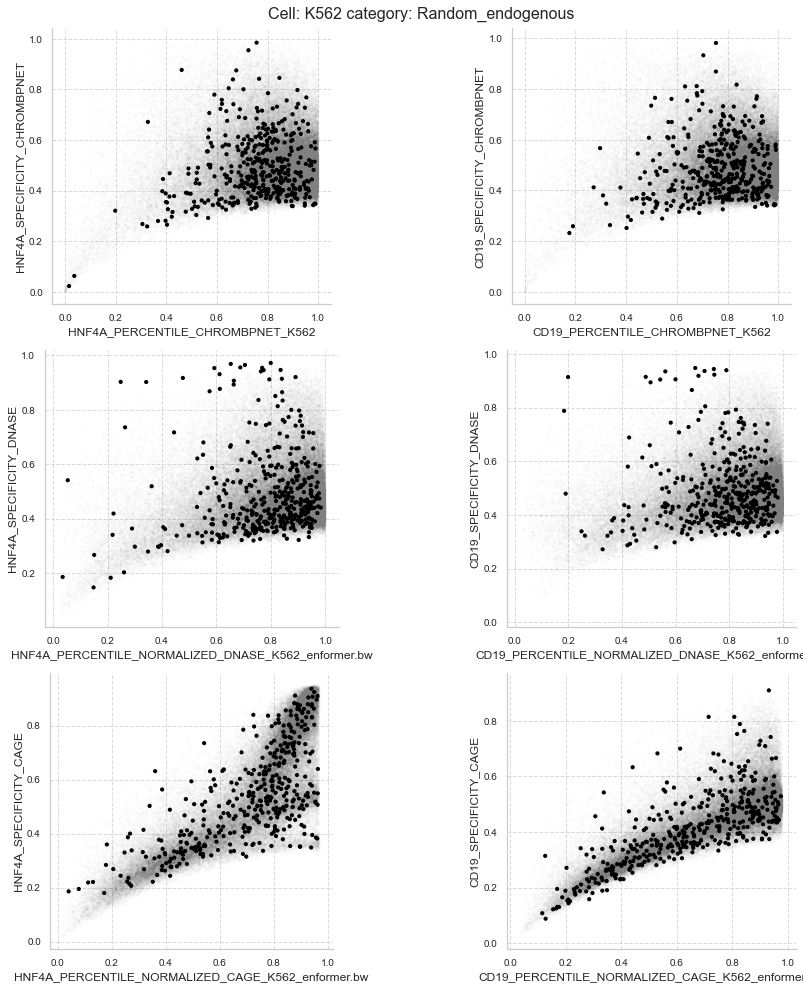

Random_generated


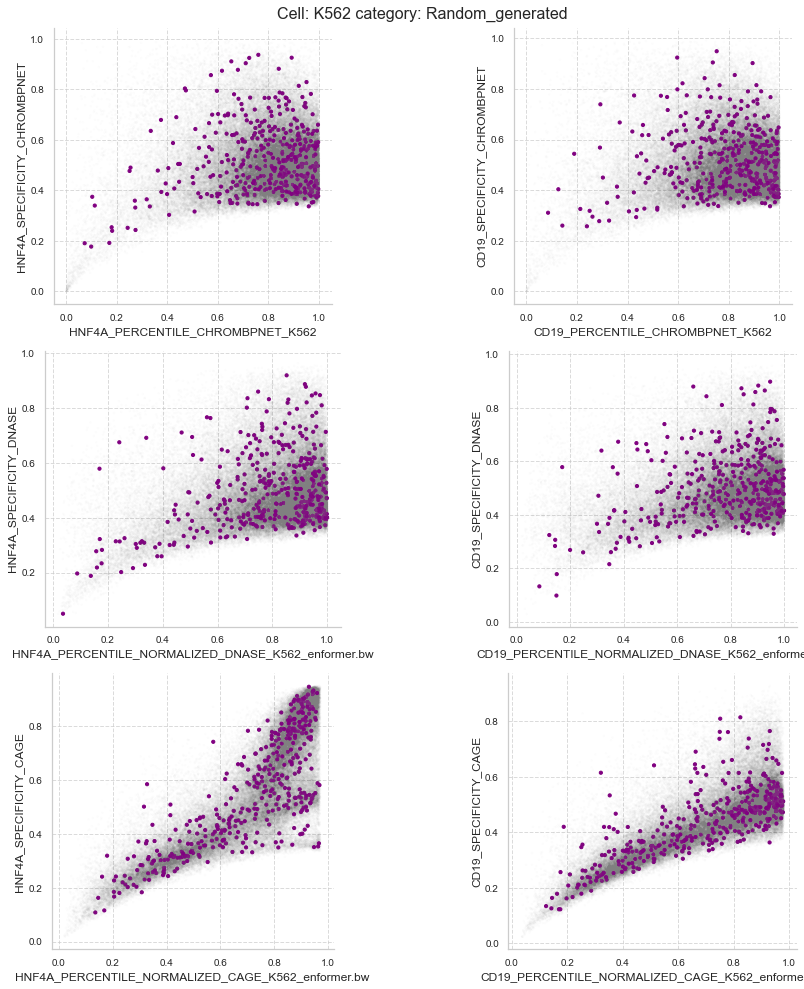

Positive_controls
Positive_controls


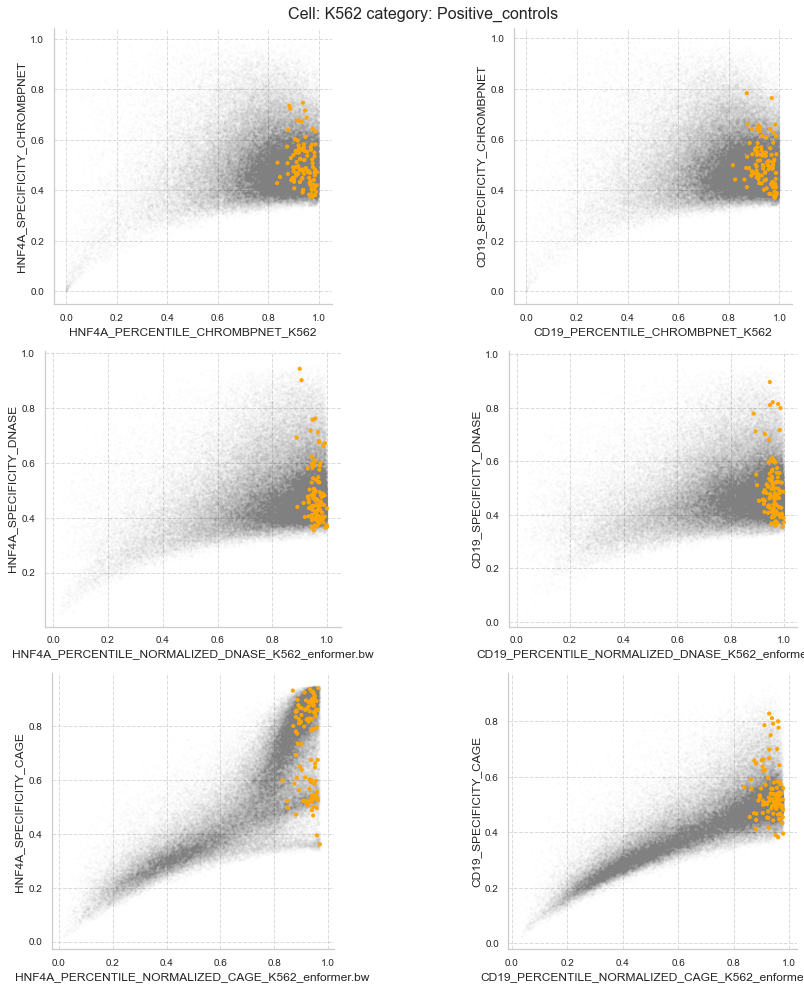

High_spec_out


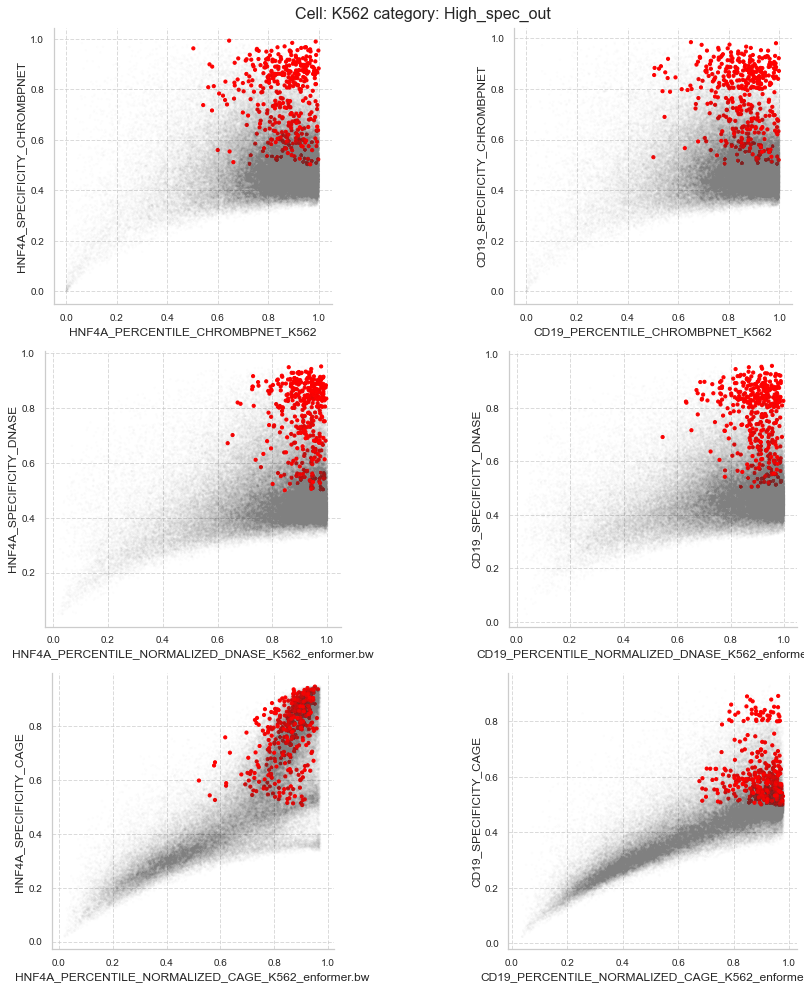

High_signal


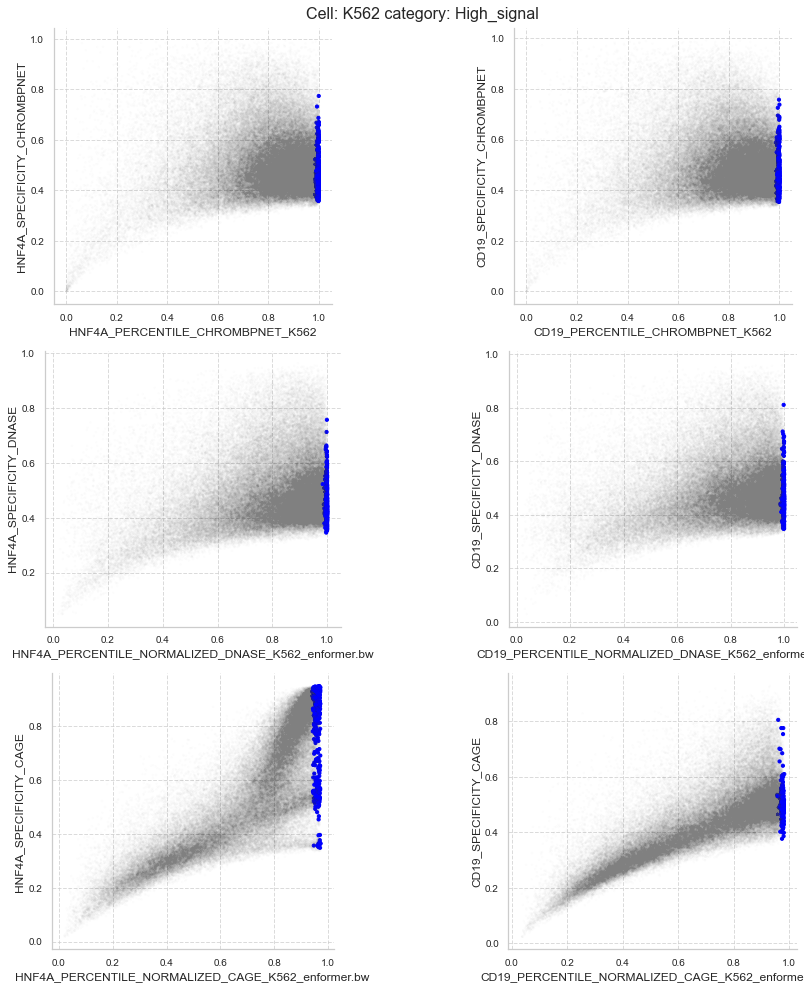

Best_cage


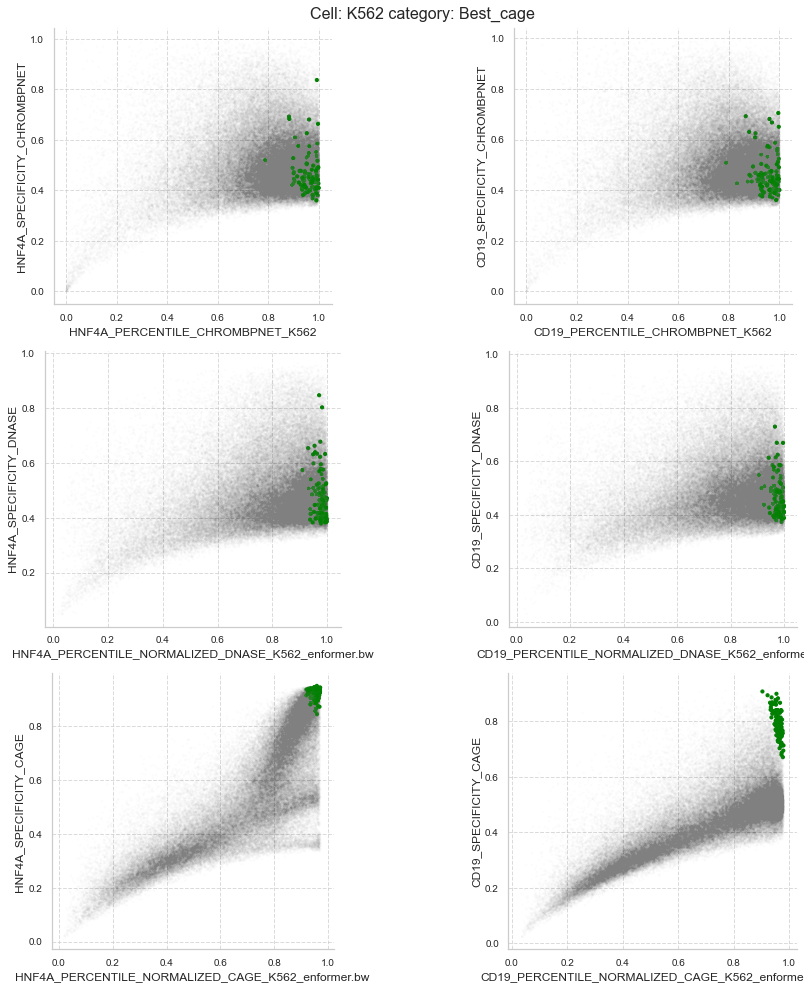

Best_accessibility


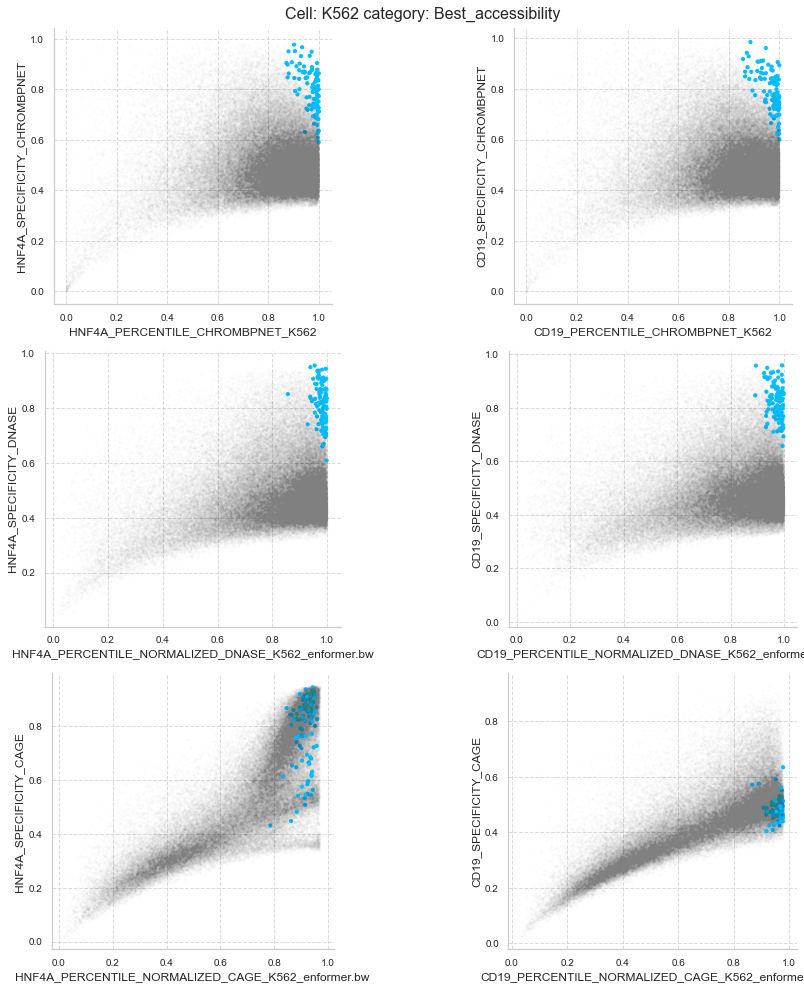

Negatives
Negatives


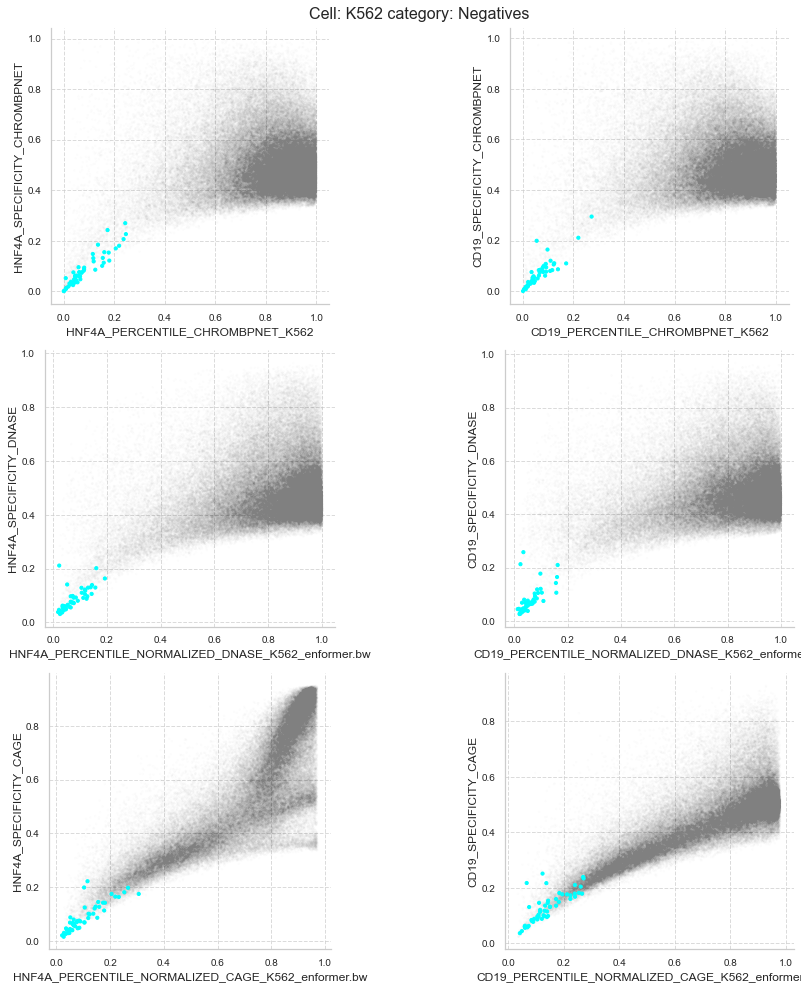

Shuffle_positive
Shuffle_positive


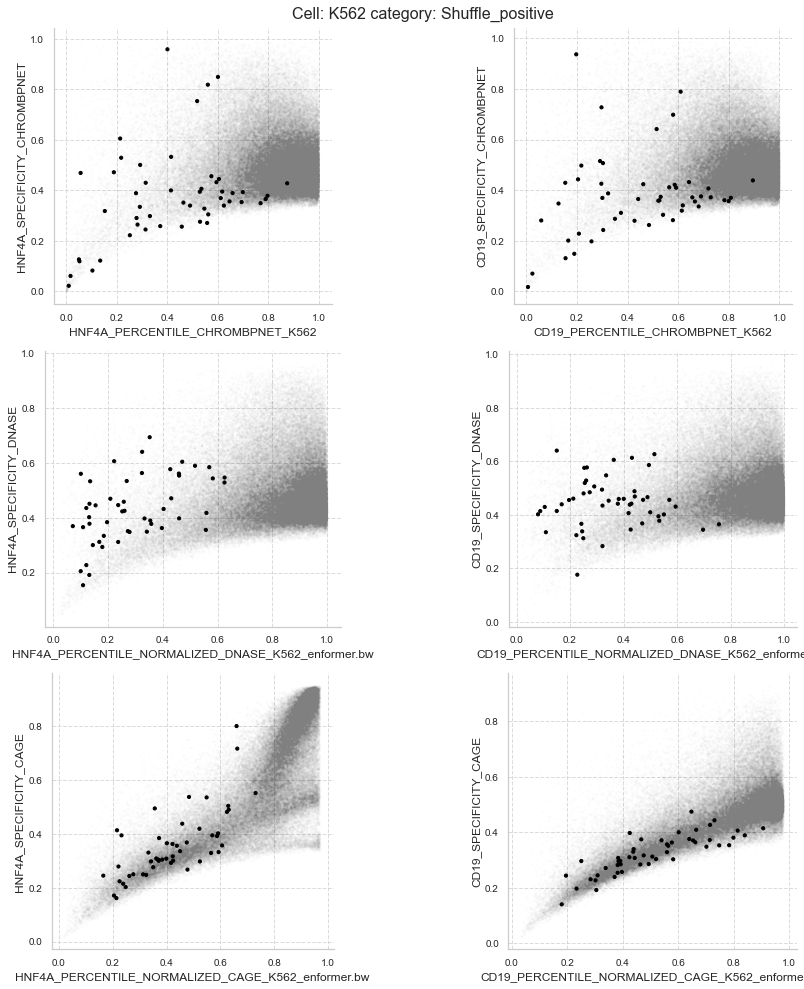

Selection:
['HepG2', 'K562', 'GM12878', '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt', 'GATA1', '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_CD19.txt', 'CD19']
Generated_sequences filtered: 64 
/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt GATA1
Index(['DNASE_GM12878_enformer.bw', 'DNASE_K562_enformer.bw',
       'DNASE_HepG2_enformer.bw', 'CAGE_GM12878_enformer.bw',
       'CAGE_K562_enformer.bw', 'CAGE_HepG2_enformer.bw', 'CHROMBPNET_GM12878',
       'CHROMBPNET_K562', 'CHROMBPNET_HepG2', 'SEQ_ID', 'CELL_TYPE',
       'SEQUENCE', 'TAG', 'NORMALIZED_DNASE_GM12878_enformer.bw',
       'NORMALIZED_DNASE_K562_enformer.bw',
       'NORMALIZED_DNASE_HepG2_enformer.bw',
       'NORMALIZED_CAGE_GM12878_enformer.bw',
       'NORMALIZ

<ipython-input-115-d4b55caca88d>:33: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  positive_controls = pd.DataFrame(positive_controls_select[positive_values_filter].head(number)['SEQ_ID'])


(1827, 109) total selection


<ipython-input-115-d4b55caca88d>:113: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  negative_controls = pd.DataFrame(negative_controls_select[negative_values_filter].head(number)['SEQ_ID'])


                    SEQ_ID
category                  
Best_CAGE              100
Best_accessibility     100
High_signal            400
High_specificity       400
Negative                50
Positive               100
Random_endogenous      400
Random_generated       400
Shuffle_positive        50
Saving.... HepG2 2000
Random_endogenous
Random_endogenous


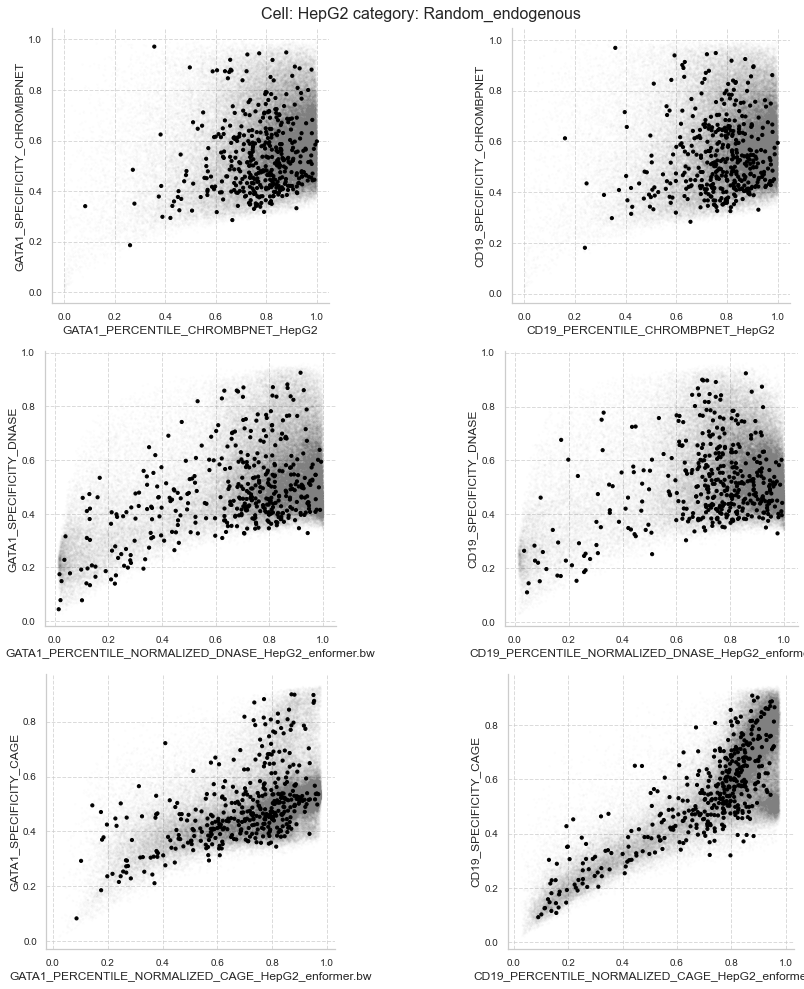

Random_generated


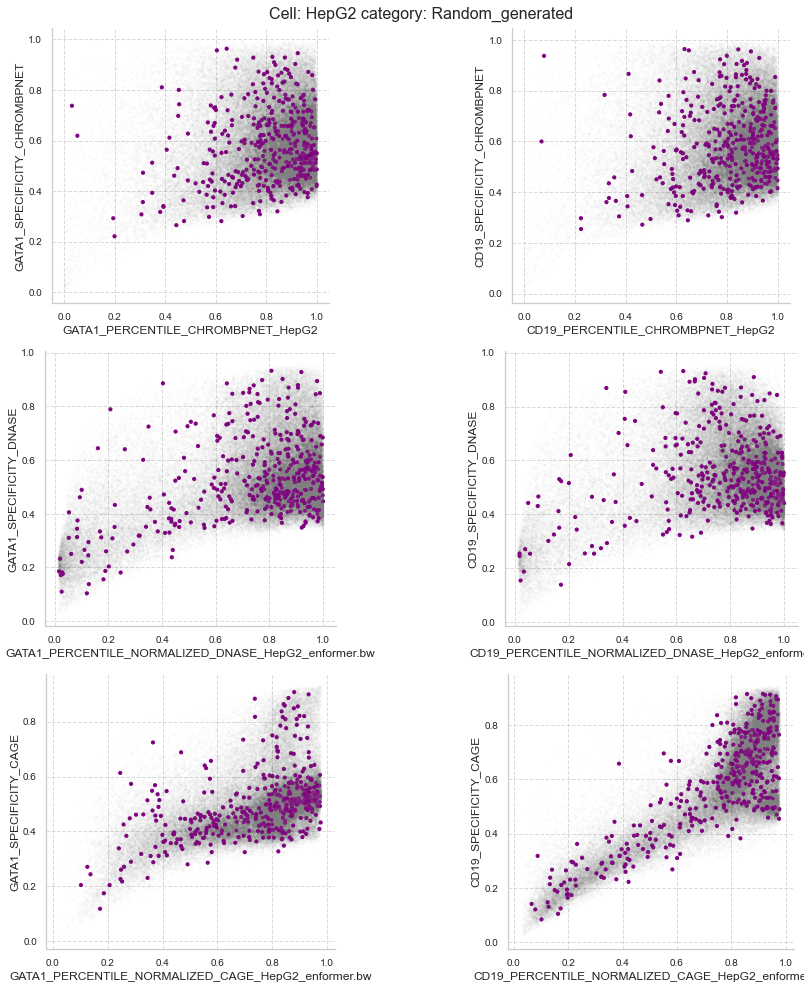

Positive_controls
Positive_controls


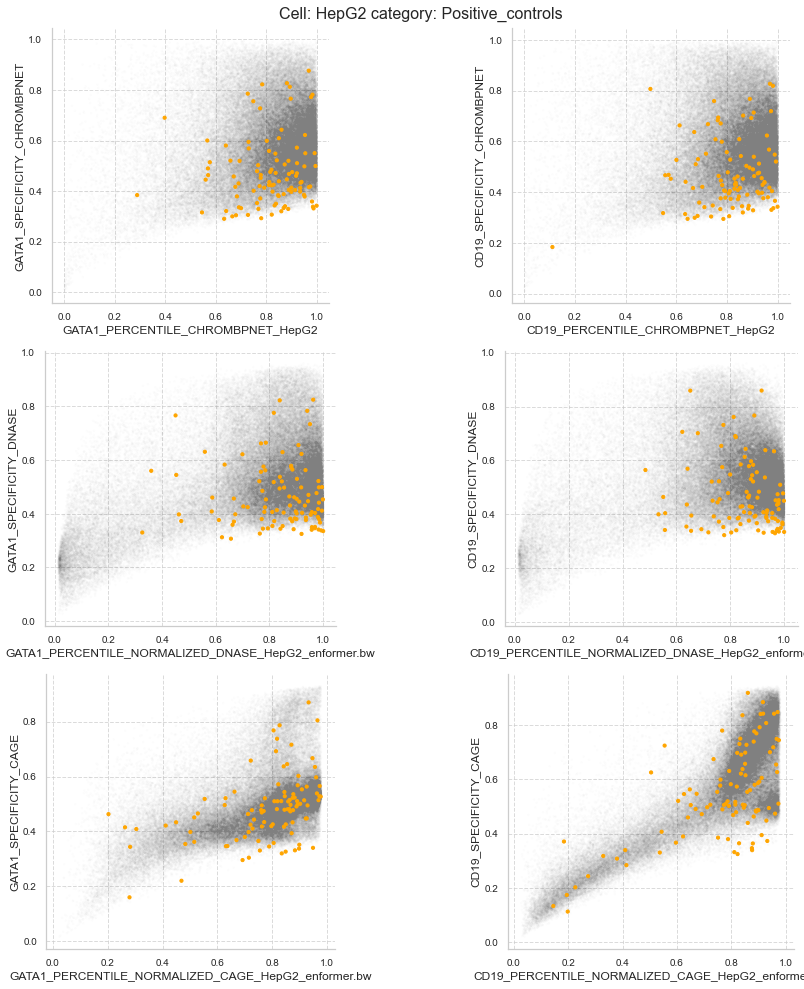

High_spec_out


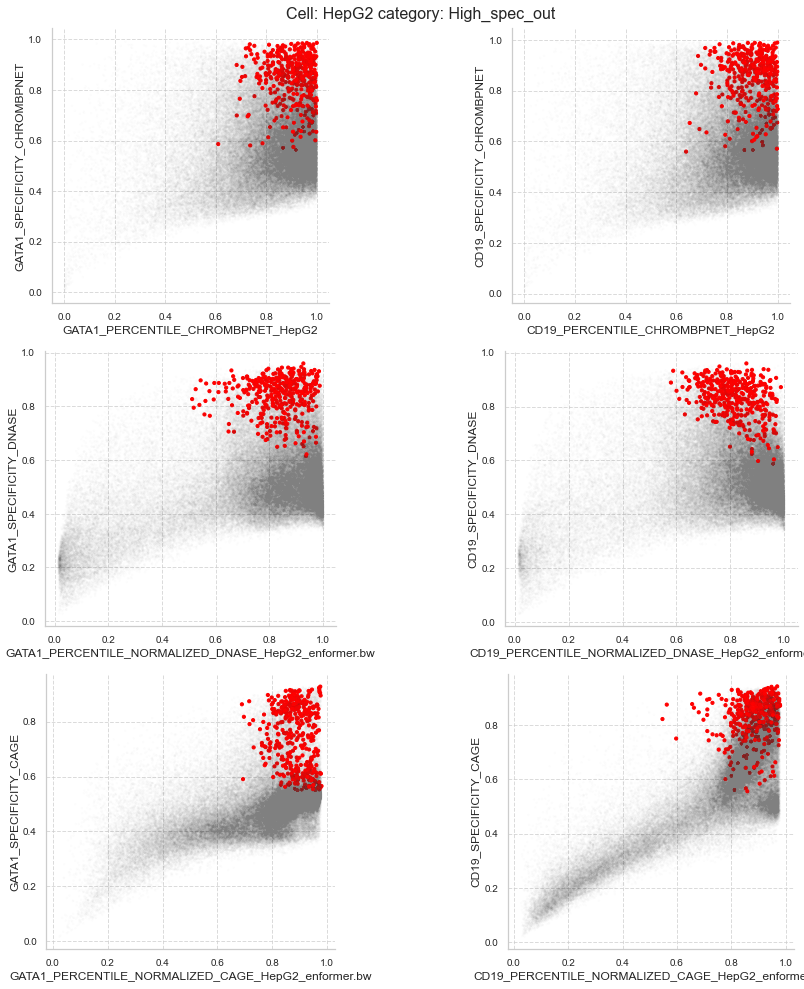

High_signal


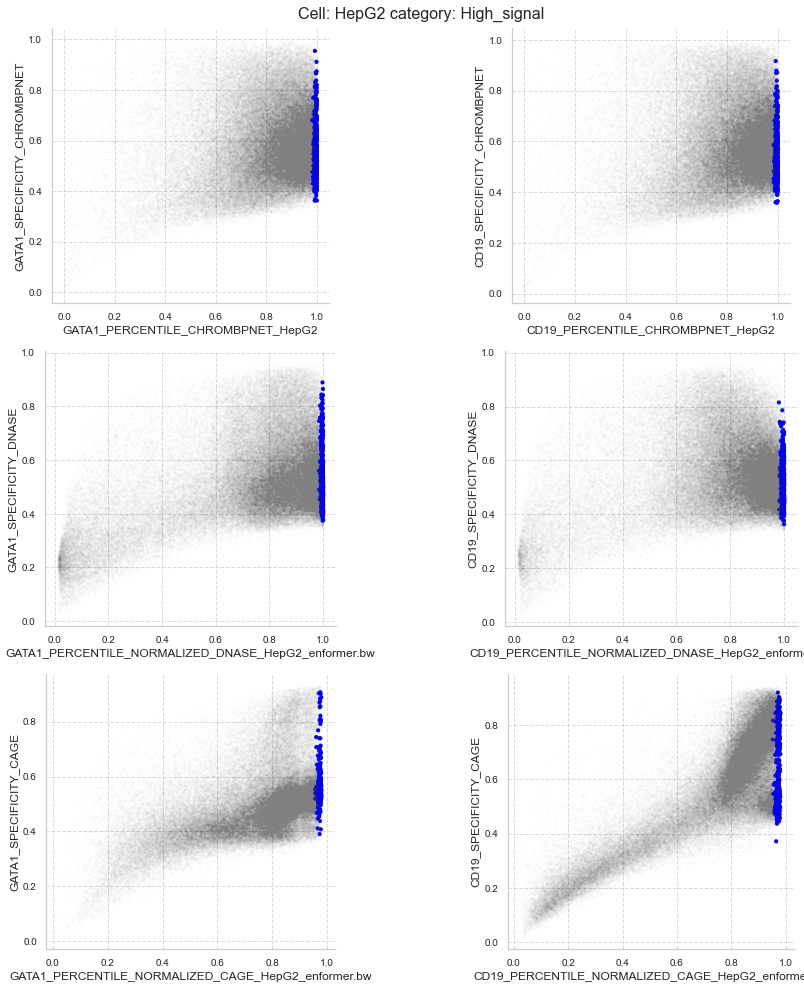

Best_cage


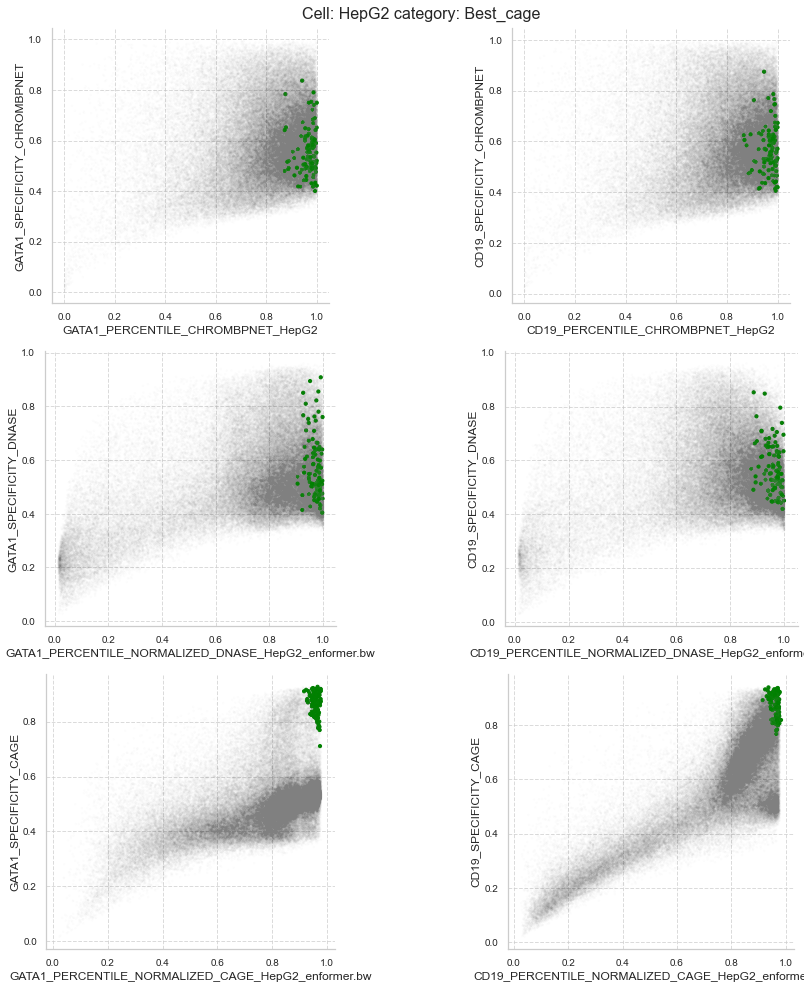

Best_accessibility


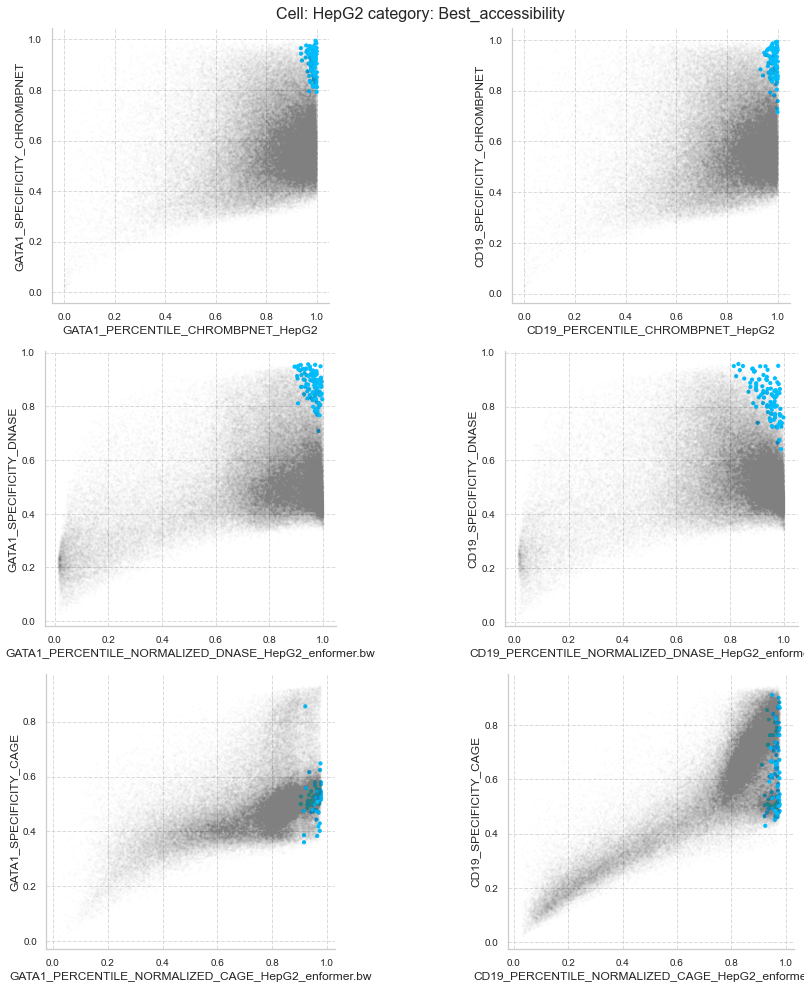

Negatives
Negatives


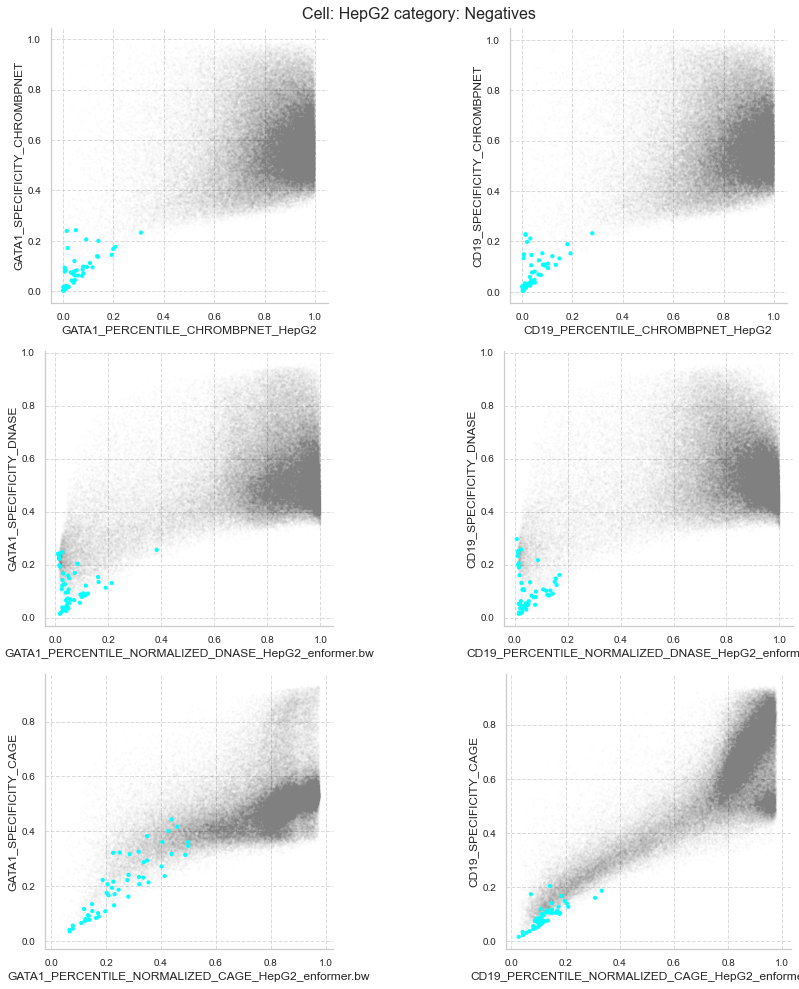

Shuffle_positive
Shuffle_positive


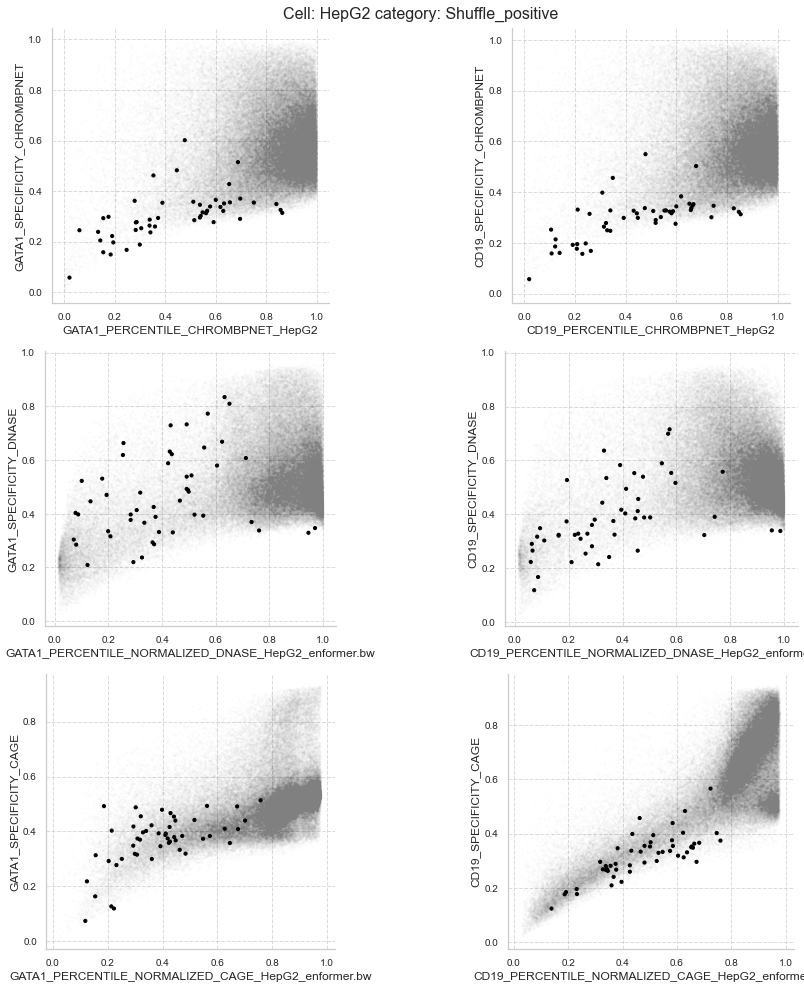

Selection:
['GM12878', 'HepG2', 'K562', '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt', 'GATA1', '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_HNF4A.txt', 'HNF4A']
Generated_sequences filtered: 64 
/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt GATA1
Index(['DNASE_GM12878_enformer.bw', 'DNASE_K562_enformer.bw',
       'DNASE_HepG2_enformer.bw', 'CAGE_GM12878_enformer.bw',
       'CAGE_K562_enformer.bw', 'CAGE_HepG2_enformer.bw', 'CHROMBPNET_GM12878',
       'CHROMBPNET_K562', 'CHROMBPNET_HepG2', 'SEQ_ID', 'CELL_TYPE',
       'SEQUENCE', 'TAG', 'NORMALIZED_DNASE_GM12878_enformer.bw',
       'NORMALIZED_DNASE_K562_enformer.bw',
       'NORMALIZED_DNASE_HepG2_enformer.bw',
       'NORMALIZED_CAGE_GM12878_enformer.bw',
       'NORMAL

<ipython-input-115-d4b55caca88d>:33: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  positive_controls = pd.DataFrame(positive_controls_select[positive_values_filter].head(number)['SEQ_ID'])


(414, 109) total selection


<ipython-input-115-d4b55caca88d>:113: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  negative_controls = pd.DataFrame(negative_controls_select[negative_values_filter].head(number)['SEQ_ID'])


                    SEQ_ID
category                  
Best_CAGE              100
Best_accessibility     100
High_signal            400
High_specificity       400
Negative                50
Positive               100
Random_endogenous      400
Random_generated       400
Shuffle_positive        50
Saving.... GM12878 2000
Random_endogenous
Random_endogenous


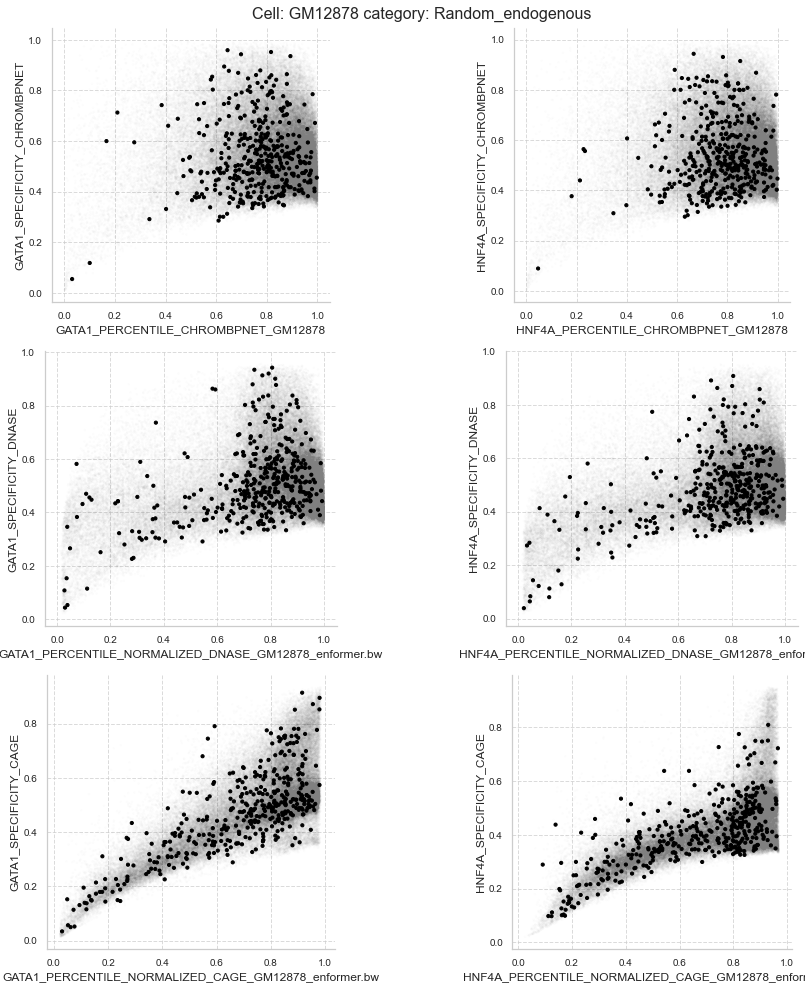

Random_generated


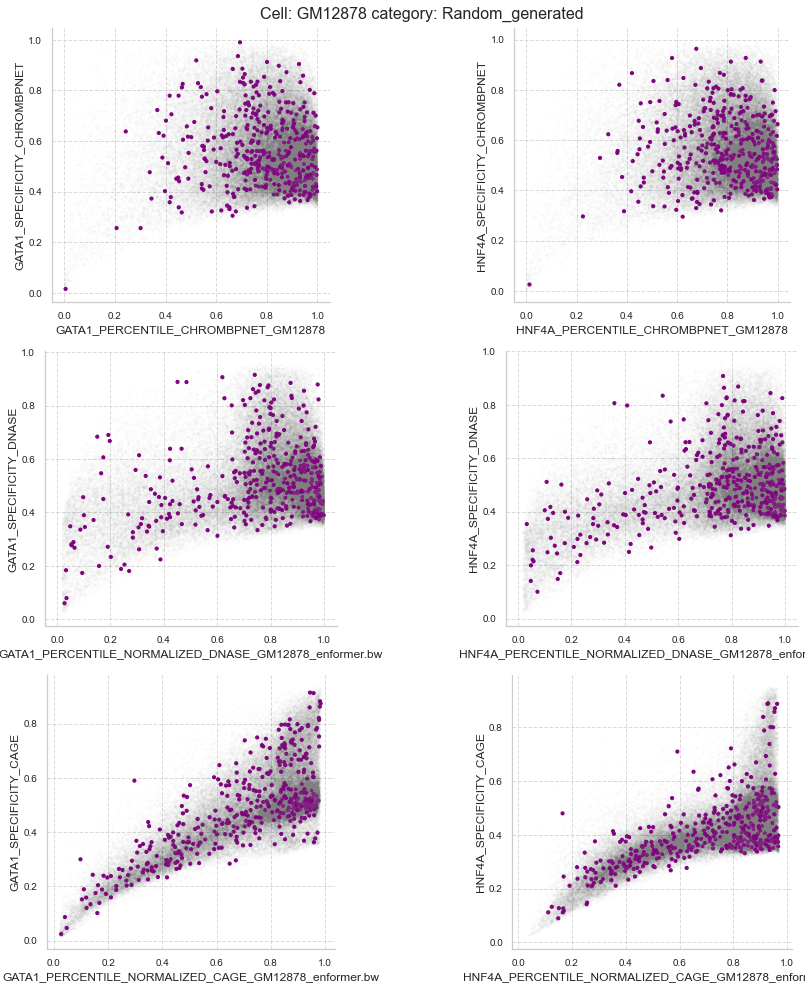

Positive_controls
Positive_controls


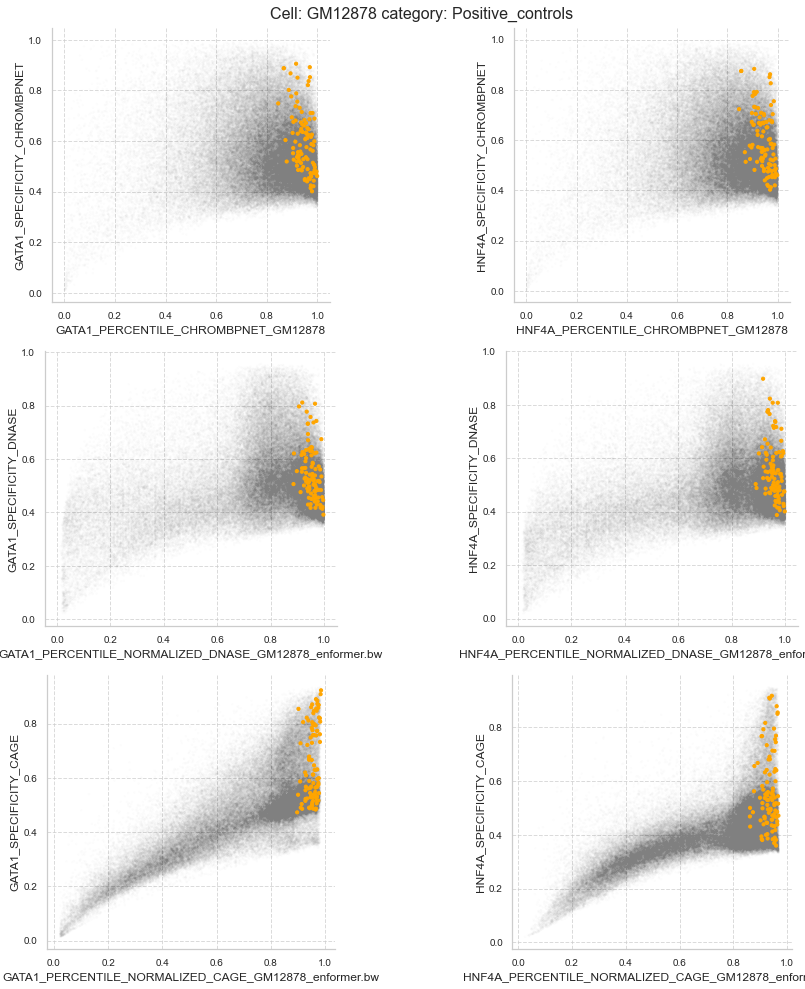

High_spec_out


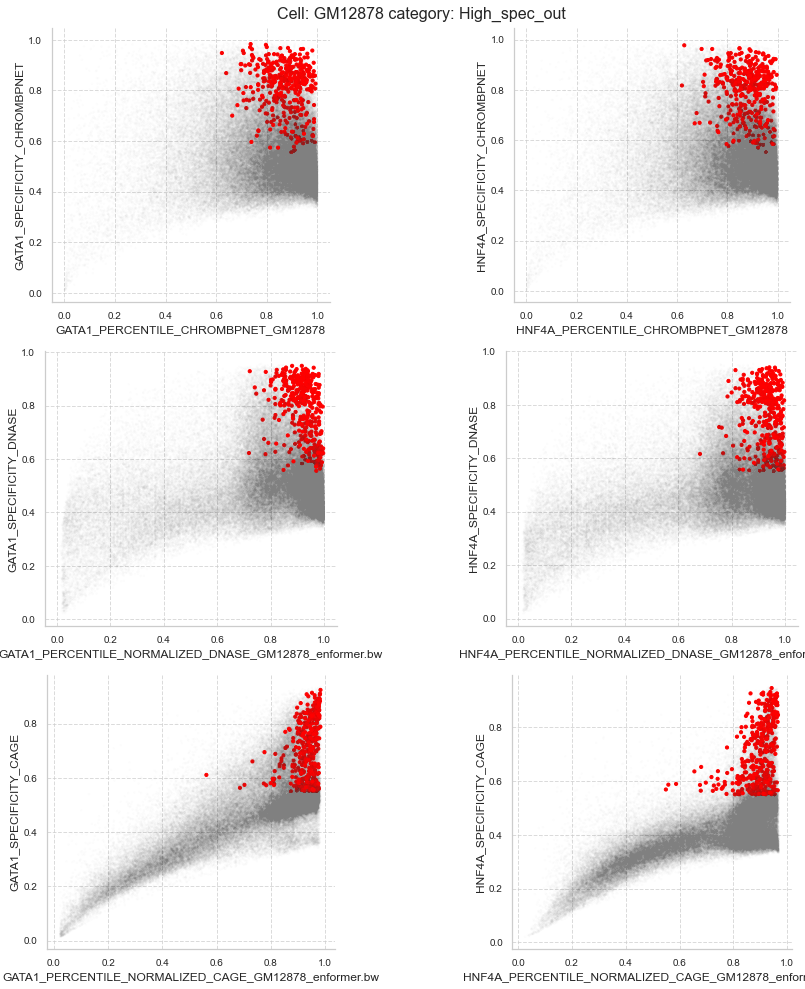

High_signal


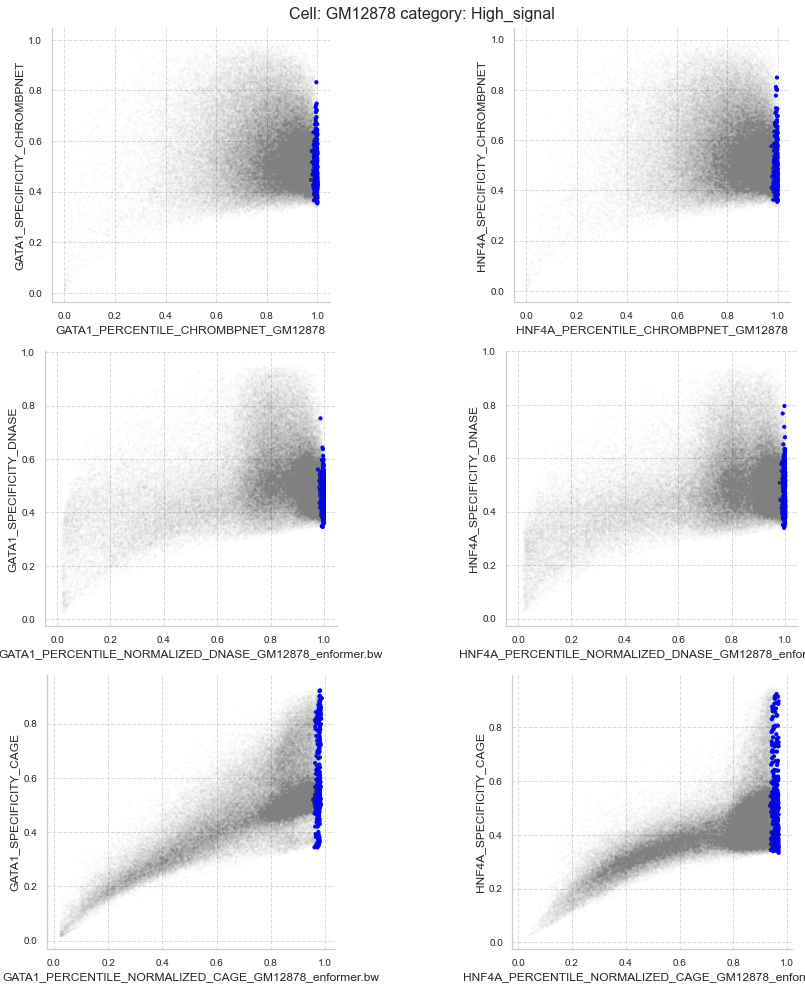

Best_cage


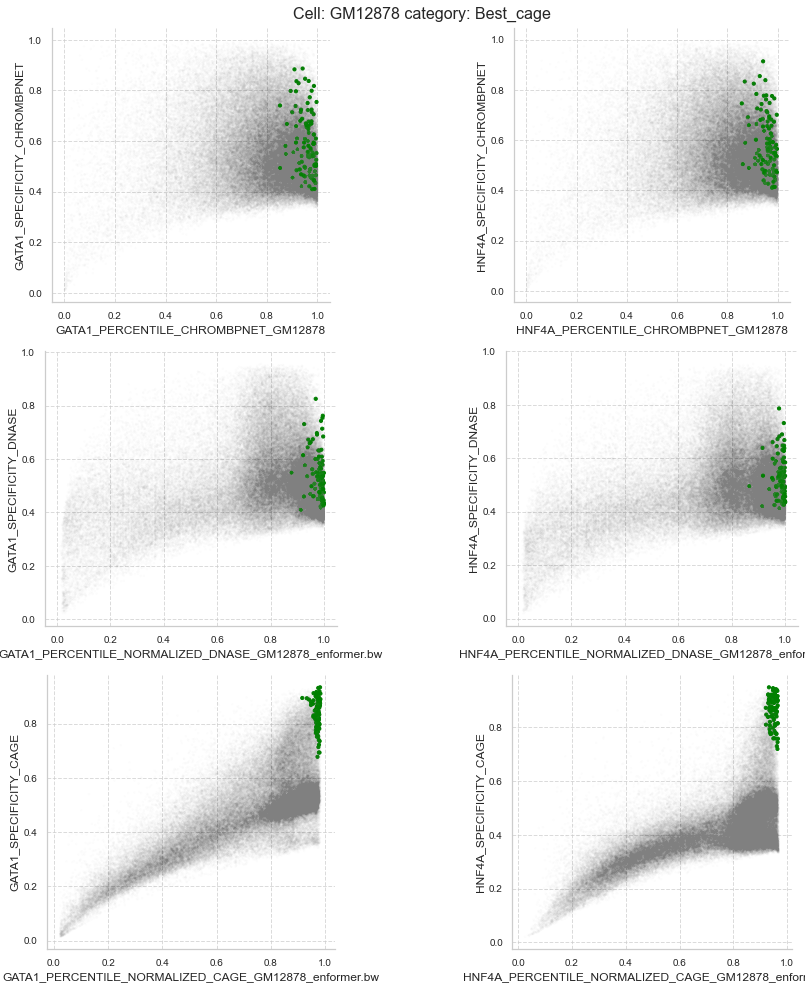

Best_accessibility


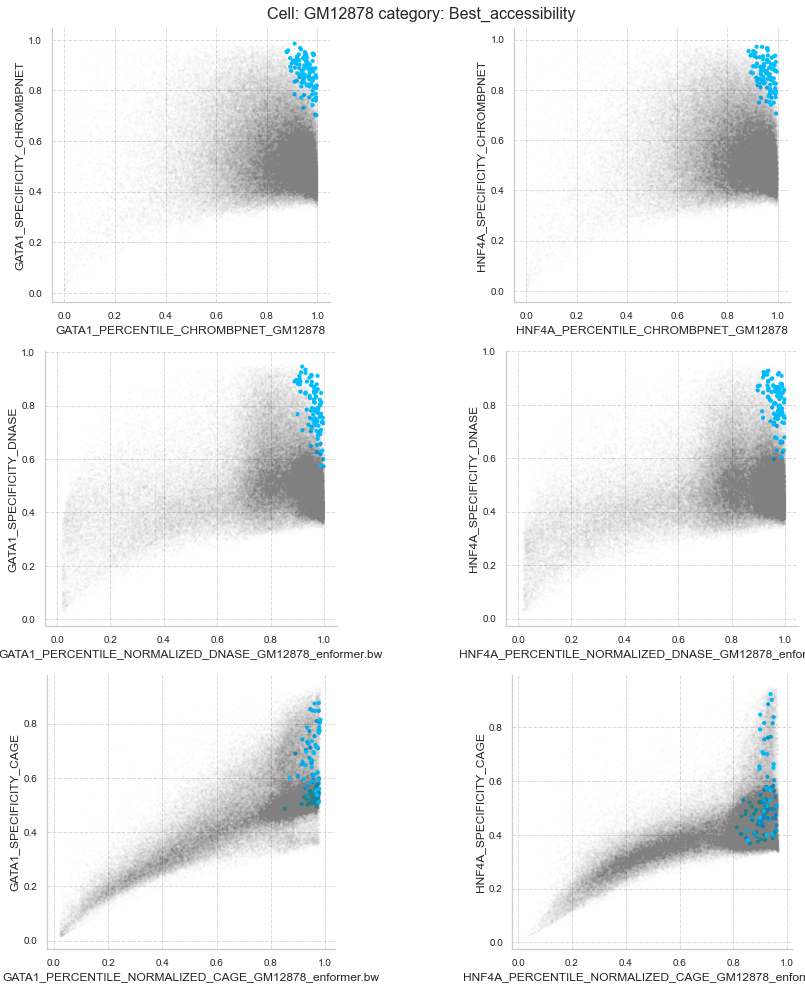

Negatives
Negatives


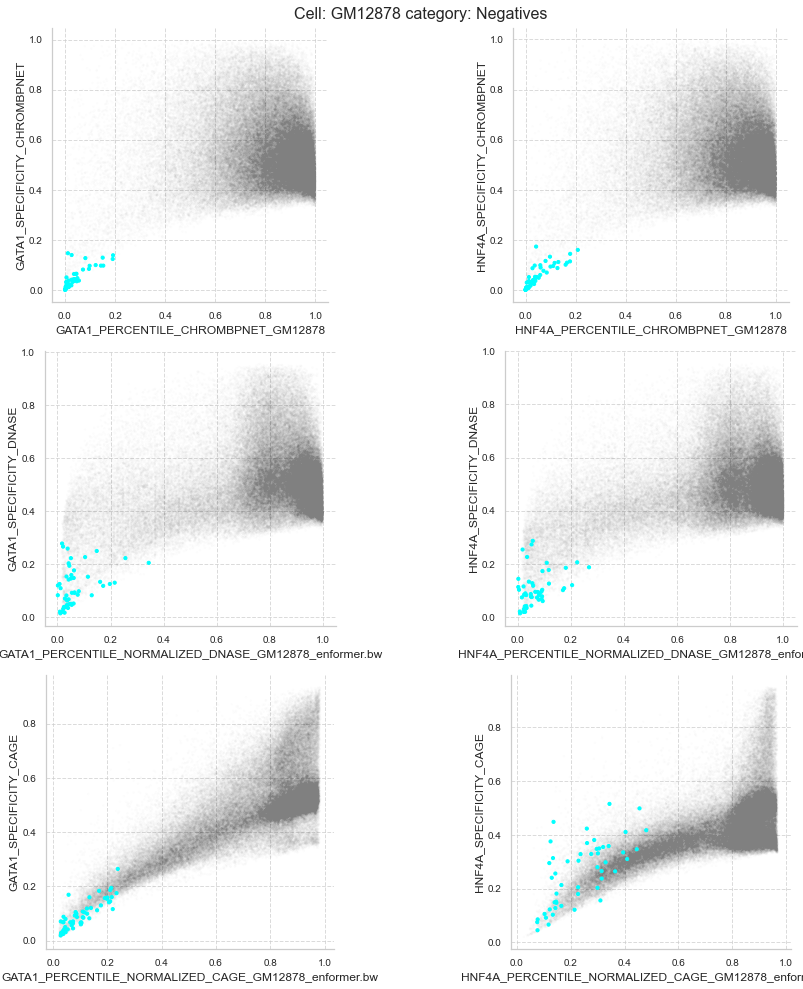

Shuffle_positive
Shuffle_positive


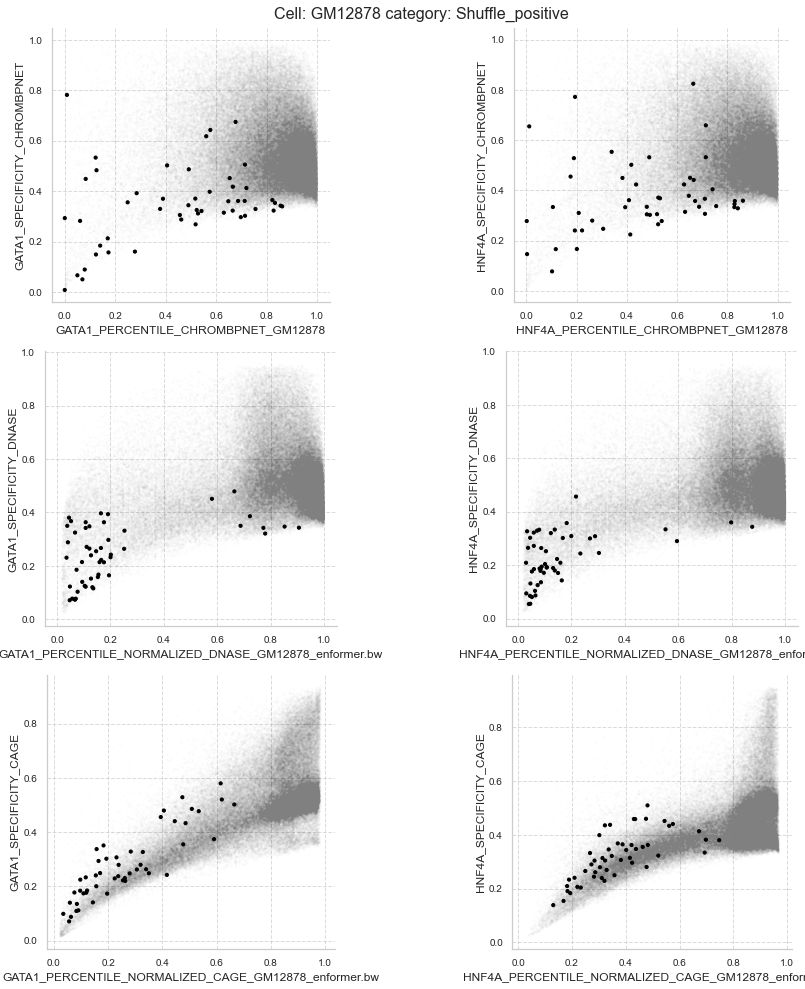

In [120]:
#Selecting K562 sequences


data_HNF4    = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_HNF4A.txt'
data_CD19    ='/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_CD19.txt'
data_GATA1   = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt'

blat_files = {
    'train':  '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/blat/blat_results.txt', 
    'generated':'/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/blat/blat_generated_generated_filtered.txt' 
}

filter_more_than_bp = 40


sample_specifications = [['K562', 'HepG2', 'GM12878', data_HNF4 , 'HNF4A', data_CD19, 'CD19'],
                         ['HepG2','K562', 'GM12878', data_GATA1, 'GATA1', data_CD19, 'CD19' ],
                         ['GM12878', 'HepG2', 'K562', data_GATA1,  'GATA1', data_HNF4, 'HNF4A']]
                         

#print ('Getting negatives')
#df_select_negatives = select_negatives([data_HNF4,  data_CD19    ,data_GATA1 ] ,number=150)
#to separate 50 per sample
#negative_per_sample = df_select_negatives.iloc[0:50], df_select_negatives.iloc[50:100], df_select_negatives.iloc[100:150]

for s in sample_specifications:
    print ('Selection:')
    print (s)
    print ('='*100)
    USE_CELL, OFF_TARGET_CELL_1, OFF_TARGET_CELL_2, first_files, first_locus_tag, second_files, second_locus_tag = s

    run_cell_selection(USE_CELL,
                        OFF_TARGET_CELL_1,
                        OFF_TARGET_CELL_2,
                        first_files,
                        first_locus_tag,
                        second_files,
                        second_locus_tag, 
                        blat_files,
                        filter_more_than_bp)
    


    


In [6]:
#Selecting NEGATIVES and POSITIVE_SHUFFLES

val_selected_HepG2 ='/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out/HepG2_validation.txt'
val_selected_GM12878='/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out/GM12878_validation.txt'
val_selected_K562 = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out/K562_validation.txt'

Long names ,
change the tags to something more informatiove /details
random -> sampled

In [24]:
dict_final_names = {"Negative":"Negative Endogenous",
"Shuffle_positive":"Positive Endogenous Sampled Shuffled by Nucleotide",
"Positive":"Positive Endogenous",
"Best_accessibility":"DNA Diffusion Highest DHS Specificty and signal",
"Best_CAGE":"DNA Diffusion Highest CAGE Specificty and Signal",
"Random_endogenous":"Endogenous DHS Sampled",
"Random_generated":"DNA Diffusion Sampled",
"High_specificity":"DNA Diffusion Specificity Focused",
"High_signal":"DNA Diffusion Signal Focused"}

for v in dict_final_names.values():
    print (v)

Negative Endogenous
Positive Endogenous Sampled Shuffled by Nucleotide
Positive Endogenous
DNA Diffusion Highest DHS Specificty and signal
DNA Diffusion Highest CAGE Specificty and Signal
Endogenous DHS Sampled
DNA Diffusion Sampled
DNA Diffusion Specificity Focused
DNA Diffusion Signal Focused


In [25]:
import random

data_GATA1   = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/normalized_predictions/normalized_GATA1.txt'


df_recover_seq = pd.read_csv(data_GATA1, sep='\t')
dict_seqs = dict(zip(df_recover_seq['SEQ_ID'].values,
                     df_recover_seq['SEQUENCE'].values))





out_dir_seq = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out'



for f in [val_selected_HepG2,
          val_selected_GM12878,
          val_selected_K562]:
    
    name = f.split('/')[-1]
    mod_df = pd.read_csv(f, sep='\t')
    mod_df['SEQUENCE'] = mod_df['SEQ_ID'].apply(lambda x : dict_seqs[x])
    final_order_df = mod_df.copy()
    final_order = ['SEQ_ID','category', 'SEQUENCE']

    final_order_df = mod_df[final_order].copy()
    final_order_df['category'] = final_order_df['category'].apply(lambda x : dict_final_names[x])
    final_order_df.to_csv(f'{out_dir_seq}/SEQ_{name}', index=None, sep='\t')
    print ('===' * 30)
    print ('duplicated', name)
    print (final_order_df.groupby("category").count())
    print (final_order_df.drop_duplicates(['SEQ_ID']).shape[0])
    print (final_order_df.groupby('SEQ_ID').count().sort_values('SEQUENCE', ascending=True))




duplicated HepG2_validation.txt
                                                    SEQ_ID  SEQUENCE
category                                                            
DNA Diffusion Highest CAGE Specificty and Signal       100       100
DNA Diffusion Highest DHS Specificty and signal        100       100
DNA Diffusion Sampled                                  400       400
DNA Diffusion Signal Focused                           400       400
DNA Diffusion Specificity Focused                      400       400
Endogenous DHS Sampled                                 400       400
Negative Endogenous                                     50        50
Positive Endogenous                                    100       100
Positive Endogenous Sampled Shuffled by Nucleotide      50        50
2000
                                 category  SEQUENCE
SEQ_ID                                             
10087_GENERATED_HEPG2                   1         1
95535_GENERATED_HEPG2                   1       

In [129]:
Seq_files = !ls /Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out/| grep 'SEQ_'

In [132]:
DNA Diffusion Highest CAGE Specificty and Signal    100 100
DNA Diffusion Highest DHS Specificty and signal 100       100
DNA Diffusion Sampled                                  400       400
DNA Diffusion Signal Focused                           400       400
DNA Diffusion Specificity Focused                      400       400
Endogenous DHS Sampled                                 400       400
Negative Endogenous                                     50        50
Positive Endogenous                                    100       100
Positive Endogenous Sampled Shuffled by Nucleotide      50        50

['SEQ_GM12878_validation.txt',
 'SEQ_HepG2_validation.txt',
 'SEQ_K562_validation.txt']

In [152]:
for f in Seq_files:
    d = pd.read_csv(pre + '/' + f, sep='\t')
    print (d.head())

                               SEQ_ID           category  \
0    chr10_49076871_49077068_49076970  Random_endogenous   
1     chr2_65388213_65388440_65388330  Random_endogenous   
2  chr6_135228581_135228780_135228690  Random_endogenous   
3     chr1_61332276_61332540_61332390  Random_endogenous   
4    chr14_97177696_97177924_97177800  Random_endogenous   

                                            SEQUENCE  
0  ATGTTCAGAATGGCTCGGGAACTTGCCCAAAACCTCAGCCTCAAAC...  
1  AAAGAAAGTTCAACCTGAGTGAATCCAGTGCTTATGAAACTCTGAA...  
2  TAGGTCCTTTTGTTGGCTACACACCATGACTGCTTCTGTTTGGGAG...  
3  CAGCTAGTTGTTGTACCATAGCTTTGCACAACCTTGAAATTCAAAC...  
4  GGCGGAAGGTAAAGGGGAAGCAGGTACCTTCCTCACAGGGCAGCAG...  
                               SEQ_ID           category  \
0    chr14_61715060_61715176_61715130  Random_endogenous   
1     chr3_49873634_49873840_49873730  Random_endogenous   
2    chr14_69372220_69372440_69372330  Random_endogenous   
3  chr2_121598175_121598400_121598290  Random_endogenous   
4    chr1

In [158]:
pre = '/Users/lf588/Downloads/draft_axin2/GATA1_USING_SIMILAR_SCRIPT/final_validation_scripts/data/selection_out/'
test = pd.concat([pd.read_csv(pre + '/' + f, sep='\t') for f in Seq_files],axis=0)
test

,SEQ_ID,category,SEQUENCE
0,chr10_49076871_49077068_49076970,Random_endogenous,ATGTTCAGAATGGCTCGGGAACTTGCCCAAAACCTCAGCCTCAAAC...
1,chr2_65388213_65388440_65388330,Random_endogenous,AAAGAAAGTTCAACCTGAGTGAATCCAGTGCTTATGAAACTCTGAA...
2,chr6_135228581_135228780_135228690,Random_endogenous,TAGGTCCTTTTGTTGGCTACACACCATGACTGCTTCTGTTTGGGAG...
3,chr1_61332276_61332540_61332390,Random_endogenous,CAGCTAGTTGTTGTACCATAGCTTTGCACAACCTTGAAATTCAAAC...
4,chr14_97177696_97177924_97177800,Random_endogenous,GGCGGAAGGTAAAGGGGAAGCAGGTACCTTCCTCACAGGGCAGCAG...
...,...,...,...
1995,chr2:118803123-118803323_shuffled,Shuffle_positive,CTGTGAGCGCGTTCTCAAGGATATCTCCCATGATCATATAAACACC...
1996,chr19:55809548-55809748_shuffled,Shuffle_positive,ACACGCGGCTTTACACTCTTCGCGCGTATCCTAGAACCGTGCTGAC...
1997,chr8:90000866-90001066_shuffled,Shuffle_positive,GGAGAGGTAGTAATAAGGTAATTATGTTTCCGACGCTAATGTTCTC...
1998,chr2:197929390-197929590_shuffled,Shuffle_positive,ACCAGAGCTATTGTTTTCTACTGCTCTCGGGCGAGTTGGTCGACTA...


In [164]:
test[test['SEQUENCE'].apply(lambda x : "TTTTTTTTTTTTTT" in x)]

,SEQ_ID,category,SEQUENCE
125,chr1_153732268_153732500_153732370,Random_endogenous,TTTCCCCAAGGAATAATTCATATACATATGTGAGGAGTCTCCAGGG...
150,chr2_64700228_64700420_64700310,Random_endogenous,GTTTCTTGATACTCTTCTGTTTGCTAAAATACATATTACAGACATT...
195,chr11_118692467_118692730_118692610,Random_endogenous,TTTTTTTTTTTTTTTTTTAGCCCTCAGCTGCCTGATGCCCATGGTT...
553,55825_GENERATED_GM12878,Random_generated,ATTCAGAACACATGTTACATATTCAAACATTTTATCTTTTGAGGAC...
600,22252_GENERATED_GM12878,Random_generated,TGGATATTTTTTTTTTTTTTTTTTAGCTTCAGCACTTTCTGAATTA...
821,chr1:107451043-107451243,Positive,TTTGTATGTCTGAAACAAGCATTCAGTTCCTCAATTCTCAATTCCC...
908,64633_GENERATED_GM12878,High_specificity,AAAAAATAATTCTGGTTGCTTAACTATTTCTGTGTGAAACTAGAAG...
1051,75999_GENERATED_GM12878,High_specificity,GTATCCTTTATTTTTAGAAACTGTGCACATAGCTTTCATGTAATGA...
1058,74856_GENERATED_GM12878,High_specificity,AATGTGAATTTGACAACTGCTAACGTTAAAGGTTTCTGGATCAAAC...
1099,75272_GENERATED_GM12878,High_specificity,TGCTTTTTTTTTTTTTTCCTCTGTCCCTCCACCCCATGCAGTTCCT...


In [156]:
pd.concat([pd.read_csv(pre + '/' + f, sep='\t') for f in Seq_files],axis=0).groupby('SEQUENCE').count()

,SEQ_ID,category
SEQUENCE,,
AAAAAAAAAAAAAAAAAAAAAAAAAAAAATCTGACCTACGTTATTTGACTTAGGTCATAAAACCTCCATTCCAGAGAGGGTCCTGCCCCACACCAGAAGGAAGGAATGAGAGAGGCTAGGAGGAATCTCAACAGACAGGCCTTGCTGGGTTTCCCCACTCAGTCTGTTAACATTAGATCGTGCCCTTTCTGTCCAGTCAT,1,1
AAAAAAAAAAAAAAAAAACAAAAGAAAAACTGCTTTTGCCCAGCCACATGCACACCCCTCAAATGTCCGGGTGAAATGGTGAAGTGAAGTTTTAGACTACTTCTGTCTTTCAGTTCCTACATTACTCATTTTACAGTGAAGCTGACTCTTAGCCTTTCTGATCTGTGAAATCTCTTTAGAATAGTTTATTACAACTAAAC,1,1
AAAAAAAAAAAAAAAACCCGTGGGCAGATGTAAGTGACTAATCTGGGTCTTTGAACTGGGTTCTGAGATGGGGAACACATTTTTCTTACCACAGCTTGATTTTGATATGAAAACCATGAACGGTCAAATCATTGCTACTAGTGAACCAAGTTGATAGAGGAAGAGTTAGGCAGTGAGGTTTCACTCAGCCTTTCAGTGTT,1,1
AAAAAAAAAAAATCAAACAAAAATGGGGTAGGAATCAAAGAGTTGAGATATTGAAAGAGGCAATGATTAACAGTTGGACTTTAATCCCACATATCTCTTGGGTTCAGTAAGCCACGGCTTTTCAAAGGACAGTATTTGGTTTTCTGTATTTGATTTCTAGTATTACTTCATATATGTTGATATTTTATGAGCCCTGTTAA,1,1
AAAAAAAAAAACAGTGTGGATGAATTAAACTGCTAGTGACCACAGACATACGCACTGATAAAGAAGGCAAGATGACATACGTCATACAGCTGACTCCTGTTGAGGAAGATAAAGTTGGAATATTCTTAGTATACATCAAGGAGGAGGAGGAGACTAAGAAAAGAAAGAGACAGACTCATGAGTCACAAAATAGACTGAAA,1,1
...,...,...
TTTTTTTTTTTCCCCCTTTTTTACCACAGTATATAATTAGCTTCCACTTCCTGAGCAGTTGTGACATCTATTTGATGCATCTGGTTGGGCCTATTTTTAGTGGGCCAGGTGGTTGCCAACCGGGCAGTGAGTCCCACAACTTCTCGACTTTAGACAGTCTGTTAGAATTTTGCATACACATATTTCTTCCAGAATCACAC,1,1
TTTTTTTTTTTGAAAATGGAGAACAACGTGAAAACTGAAAGACCTCTTGTGATTGATTCTGGTTTCAGTTCTGCTTAGTGGCTGTTTCCAGAATAGCATATTGCTTCACCTGGCTGAGAACAGAGTTTCCAAGTTCCCCATTGCGATGGAAAGACCAGTTGCTTCAAAACTGTGCATGTGGATGCCTAGGATGATTGAGG,1,1
TTTTTTTTTTTTTTCTTTTTTTGCAGCTGCAGGTTGTGGCTGGAAATGCTGATCCAAGTGTGTGGTCAGGGGGAAGTGGAAGAGAAAATTCTGCATGACTCTCACAATTTTCAGTTTCAGAATTACTGATGCGGCGGTGGCACAATTGAAAAGTAAAACCGCTTCTGAAACCACTCATGCTGCCATTCTGTGCAGAAGAA,1,1


In [ ]:
random.shuffle([ x for x in 'ABCD'])

''.join(random.sample('ABCD',len('ABCD')))

In [ ]:


def select_negatives(data_list ,number=150)
    #[data_HNF4,  data_CD19    ,data_GATA1 ]
    all_dfs_to_negative = [ pd.read_csv(d_open, sep='\t') for d_open in ]
    df_neg_concat = pd.concat(all_dfs_to_negative,axis=1)
    df_neg_concat.columns.values
    df_neg_concat['rank_in_all_metrics_and_locus'] =df_neg_concat[[c_n for c_n in  df_neg_concat.columns if 'NORMALIZED' in c_n and not 'PERCENTILE_' in c_n ]].rank().mean(1)
    df_neg_concat['TAG_NOT_DUPLICATED'] = df_neg_concat['TAG'].T.iloc[0].values
    df_negatives_only = df_neg_concat.query('TAG_NOT_DUPLICATED == "Negative" ')
    df_negatives_only = df_negatives_only.sort_values('rank_in_all_metrics_and_locus')
    df_selected_negatives = df_negatives_only.head(number)[['SEQ_ID']].COPY()
    df_selected_negatives['category'] = 'Negatives'
    return df_selected_negatives



In [ ]:
sns.boxplot(x='TAG_NOT_DUPLICATED', y='rank_in_all_metrics_and_locus', data=df_neg_concat )
plt.xticks(rotation=90)

In [ ]:
# chrom_spec = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.8).all(axis=1)  &  (df_cell_centrinc_rank[[c for c in specificity_cols_to_filter if 'CHROMBPNET' in c]] > 0.75).all(axis=1)

# DNASE_spec = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.8).all(axis=1)  &  (df_cell_centrinc_rank[[c for c in specificity_cols_to_filter if 'DNASE' in c]] > 0.75).all(axis=1)

# CAGE_spec = (df_cell_centrinc_rank[sig_cols_to_filter] > 0.8).all(axis=1)  &  (df_cell_centrinc_rank[[c for c in specificity_cols_to_filter if 'CAGE' in c]] > 0.75).all(axis=1)

In [ ]:
# df_test_enformer =  df_cell_centrinc_rank[filter_conditions]
# enformer_eval_cols = [c for c in specificity_cols_to_filter if 'CHROMBPNET' not in c]
# df_test_enformer['enformer_evaluation_rank'] =df_test_enformer[enformer_eval_cols].rank().mean(1)
# df_test_enformer = df_test_enformer.sort_values('enformer_evaluation_rank')

# specificity_20_bottom = set(df_test_enformer[enformer_eval_cols + ['enformer_evaluation_rank', 'SEQ_ID'] ].head(20)['SEQ_ID'].values.tolist())

# filter_conditions = (df_cell_centrinc_rank[specificity_cols_to_filter_second_locus] > 0.8).all(axis=1)

# set_top_selection = set(df_cell_centrinc_rank[filter_conditions]['SEQ_ID'].values)

# len(set_top_selection)

# filter_conditions = (df_cell_centrinc_rank[specificity_cols_to_filter_second_locus] > 0.8).all(axis=1)

# set_top_selection = set(df_cell_centrinc_rank[filter_conditions]['SEQ_ID'].values)

# len(set_top_selection)

In [ ]:
# from scipy.stats import pearsonr


# def generate_correlation_plot(df_corr, selection, col1, col2):

#     data = df_corr[df_corr['SEQ_ID'].apply(lambda x : x in  selection  )].copy()
#     fig, ax = plt.subplots(figsize=(10,10))
#     ax.scatter(data[col1].values, data[col2].values )




#         #obtain m (slope) and b(intercept) of linear regression line
#     m, b = np.polyfit(data[col1].values,  data[col2].values, 1)

#     #add linear regression line to scatterplot 
#     ax.plot(data[col1].values, m*data[col1].values+b, lw=5 , color='black')
#     ax.set_aspect('equal', adjustable='box')
#     plt.text(0.9, 0.8, 'pearsonr ' +  str( pearsonr(data[col1].values,  data[col2].values)[0]) )
#     plt.show()

# generate_correlation_plot(first_locus, set_top_selection, 'GATA1_PERCENTILE_CHROMBPNET_GM12878', 'GATA1_PERCENTILE_NORMALIZED_DNASE_GM12878_enformer.bw')





#         # # Setting labels and title
#         # ax[n].set_xlabel(signal, fontsize=12)
#         # ax[n].set_ylabel(specificity, fontsize=12)
#         # ax[n].set_title(f"{title} {specificity.replace('SPECIFICITY_', '')}", fontsize=14)

#         # # Set aspect ratio

In [ ]:

# cell_type_basic_plot = 'GM12878'
# locus_tag = 'GATA1'
# show_groups_plot(first_locus, locus_tag, cell_type_basic_plot, set_top_selection)


# cell_type_basic_plot = 'GM12878'
# locus_tag = 'HNF4A'
# show_groups_plot(second_locus, locus_tag, cell_type_basic_plot, set_top_selection)




In [ ]:



# cell_type_basic_plot = 'GM12878'
# locus_tag = 'GATA1'
# show_groups_plot(first_locus, locus_tag, cell_type_basic_plot, specificity_20_bottom)

# 
# cell_type_basic_plot = 'GM12878'
# locus_tag = 'HNF4A'
# show_groups_plot(second_locus, locus_tag, cell_type_basic_plot, specificity_20_bottom)


In [ ]:

# cell_type_basic_plot = 'GM12878'
# locus_tag = 'GATA1'
# show_groups_plot(first_locus, locus_tag, cell_type_basic_plot, set_top_selection)


# cell_type_basic_plot = 'GM12878'
# locus_tag = 'HNF4A'
# show_groups_plot(second_locus, locus_tag, cell_type_basic_plot, set_top_selection)


